# Scene Classification



Import libraries for data loading, training, evaluation, and visualization

In [ ]:
import os
import time
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

SEED = 42
tf.keras.utils.set_random_seed(SEED)

print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.20.0


Determine GPU Availability

In [ ]:
# Checking for GPU

print("GPU devices:", tf.config.list_physical_devices("GPU"))
!nvidia-smi

GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Mon May  4 12:37:57 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8             13W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                 

Mount Google Drive and Set Paths




In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from pathlib import Path

DATASET_DIR = Path("/content/drive/MyDrive/Artificial Intelligence/Scene Classification-2")

BASE_DIR = DATASET_DIR
TRAIN_DIR = BASE_DIR / "train"
TEST_DIR = BASE_DIR / "test"

# Save all generated models, CSVs, and summaries beside the dataset folder.
PROJECT_DIR = BASE_DIR.parent
OUTPUT_DIR = PROJECT_DIR / "Scene Classification Outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print("Base directory exists:", BASE_DIR.exists())
print("Train directory exists:", TRAIN_DIR.exists())
print("Test directory exists:", TEST_DIR.exists())
print("Output directory exists:", OUTPUT_DIR.exists())
print("Output directory:", OUTPUT_DIR)

if not BASE_DIR.exists():
    raise FileNotFoundError(f"Dataset folder not found: {BASE_DIR}")

if not TRAIN_DIR.exists():
    raise FileNotFoundError(f"Train folder not found: {TRAIN_DIR}")

if not TEST_DIR.exists():
    raise FileNotError(f"Test folder not found: {TEST_DIR}")

Base directory exists: True
Train directory exists: True
Test directory exists: True
Output directory exists: True
Output directory: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs


The class names are detected from the training folder and checked against the test folder.

In [ ]:
train_classes = sorted([folder.name for folder in TRAIN_DIR.iterdir() if folder.is_dir()])
test_classes = sorted([folder.name for folder in TEST_DIR.iterdir() if folder.is_dir()])

if train_classes != test_classes:
    raise ValueError("Train and test class folders do not match. Check dataset structure.")

CLASS_NAMES = train_classes
NUM_CLASSES = len(CLASS_NAMES)

class_to_index = {class_name: index for index, class_name in enumerate(CLASS_NAMES)}
index_to_class = {index: class_name for class_name, index in class_to_index.items()}

print("Classes:", CLASS_NAMES)
print("Number of classes:", NUM_CLASSES)
print("Class mapping:", class_to_index)

Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Number of classes: 6
Class mapping: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


Create Metadata.csv and ignore corrupt files

In [ ]:
clean_metadata_path = OUTPUT_DIR / "clean_metadata.csv"


def scan_images(directory, split_name):
    records = []
    image_extensions = [".jpg", ".jpeg", ".png"]

    for class_folder in sorted(directory.iterdir()):
        if not class_folder.is_dir():
            continue

        class_name = class_folder.name

        for img_path in class_folder.rglob("*"):
            if img_path.suffix.lower() not in image_extensions:
                continue

            try:
                with Image.open(img_path) as img:
                    img.verify()

                with Image.open(img_path) as img:
                    width, height = img.size
                    mode = img.mode

                records.append({
                    "path": str(img_path),
                    "split": split_name,
                    "class": class_name,
                    "width": width,
                    "height": height,
                    "mode": mode,
                    "is_valid": True,
                    "error": None
                })

            except Exception as error:
                records.append({
                    "path": str(img_path),
                    "split": split_name,
                    "class": class_name,
                    "width": np.nan,
                    "height": np.nan,
                    "mode": None,
                    "is_valid": False,
                    "error": str(error)
                })

    return pd.DataFrame(records)


if clean_metadata_path.exists():
    clean_df = pd.read_csv(clean_metadata_path)
    print("Loaded existing clean metadata:", clean_metadata_path)

    # Reconstruct a lightweight meta_df for summary consistency.
    meta_df = clean_df.copy()
    corrupt_df = pd.DataFrame(columns=clean_df.columns)

else:
    train_meta = scan_images(TRAIN_DIR, "train")
    test_meta = scan_images(TEST_DIR, "test")
    meta_df = pd.concat([train_meta, test_meta], ignore_index=True)

    corrupt_df = meta_df[meta_df["is_valid"] == False].copy()
    clean_df = meta_df[meta_df["is_valid"] == True].copy()

    clean_df.to_csv(clean_metadata_path, index=False)
    print("Created and saved clean metadata:", clean_metadata_path)

print("Total valid images:", len(clean_df))
print("Corrupt images found in this run:", len(corrupt_df))

display(clean_df.groupby(["split", "class"]).size().reset_index(name="image_count"))

display(corrupt_df.head())

Created and saved clean metadata: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/clean_metadata.csv
Total valid images: 16992
Corrupt images found in this run: 42


,split,class,image_count
0,test,buildings,437
1,test,forest,474
2,test,glacier,553
3,test,mountain,525
4,test,sea,510
5,test,street,501
6,train,buildings,2184
7,train,forest,2264
8,train,glacier,2397
9,train,mountain,2505


,path,split,class,width,height,mode,is_valid,error
993,/content/drive/MyDrive/Artificial Intelligence...,train,buildings,NaN,NaN,None,False,cannot identify image file '/content/drive/MyD...
994,/content/drive/MyDrive/Artificial Intelligence...,train,buildings,NaN,NaN,None,False,cannot identify image file '/content/drive/MyD...
995,/content/drive/MyDrive/Artificial Intelligence...,train,buildings,NaN,NaN,None,False,cannot identify image file '/content/drive/MyD...
996,/content/drive/MyDrive/Artificial Intelligence...,train,buildings,NaN,NaN,None,False,cannot identify image file '/content/drive/MyD...
997,/content/drive/MyDrive/Artificial Intelligence...,train,buildings,NaN,NaN,None,False,cannot identify image file '/content/drive/MyD...


Training set into 80% training and 20% validation set

Two image sizes are prepared:

1. 150 * 150 for scratch CNN
2. 224 * 224 for Transfer learning

In [ ]:
SCRATCH_IMG_SIZE = (150, 150)
TRANSFER_IMG_SIZE = (224, 224)
BATCH_SIZE = 32
VALIDATION_SIZE = 0.20

train_clean_df = clean_df[clean_df["split"] == "train"].copy()
test_clean_df = clean_df[clean_df["split"] == "test"].copy()

train_clean_df["label"] = train_clean_df["class"].map(class_to_index)
test_clean_df["label"] = test_clean_df["class"].map(class_to_index)

train_paths, val_paths, train_labels, val_labels = train_test_split(
    train_clean_df["path"].values,
    train_clean_df["label"].values,
    test_size=VALIDATION_SIZE,
    random_state=SEED,
    stratify=train_clean_df["label"].values
)

test_paths = test_clean_df["path"].values
test_labels = test_clean_df["label"].values

print("Training samples:", len(train_paths))
print("Validation samples:", len(val_paths))
print("Testing samples:", len(test_paths))

Training samples: 11193
Validation samples: 2799
Testing samples: 3000


In [ ]:
def load_image(path, label, image_size):
    image = tf.io.read_file(path)
    image = tf.io.decode_image(image, channels=3, expand_animations=False)
    image.set_shape([None, None, 3])
    image = tf.image.resize(image, image_size)

    label = tf.one_hot(label, depth=NUM_CLASSES)
    return image, label


def create_dataset(paths, labels, image_size, batch_size=BATCH_SIZE, shuffle=False):
    dataset = tf.data.Dataset.from_tensor_slices((paths, labels))

    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(paths), seed=SEED, reshuffle_each_iteration=True)

    dataset = dataset.map(
        lambda path, label: load_image(path, label, image_size),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset


train_ds_150 = create_dataset(train_paths, train_labels, SCRATCH_IMG_SIZE, shuffle=True)
val_ds_150 = create_dataset(val_paths, val_labels, SCRATCH_IMG_SIZE, shuffle=False)
test_ds_150 = create_dataset(test_paths, test_labels, SCRATCH_IMG_SIZE, shuffle=False)

train_ds_224 = create_dataset(train_paths, train_labels, TRANSFER_IMG_SIZE, shuffle=True)
val_ds_224 = create_dataset(val_paths, val_labels, TRANSFER_IMG_SIZE, shuffle=False)
test_ds_224 = create_dataset(test_paths, test_labels, TRANSFER_IMG_SIZE, shuffle=False)

for images, labels in train_ds_150.take(1):
    print("150x150 image batch:", images.shape)
    print("Label batch:", labels.shape)
    print("Pixel range before normalization:", float(tf.reduce_min(images)), "to", float(tf.reduce_max(images)))

for images, labels in train_ds_224.take(1):
    print("224x224 image batch:", images.shape)

150x150 image batch: (32, 150, 150, 3)
Label batch: (32, 6)
Pixel range before normalization: 0.0 to 255.0
224x224 image batch: (32, 224, 224, 3)


Data augmentation is used only during training. Normalization rescales pixel values from 0-255 to 0-1.

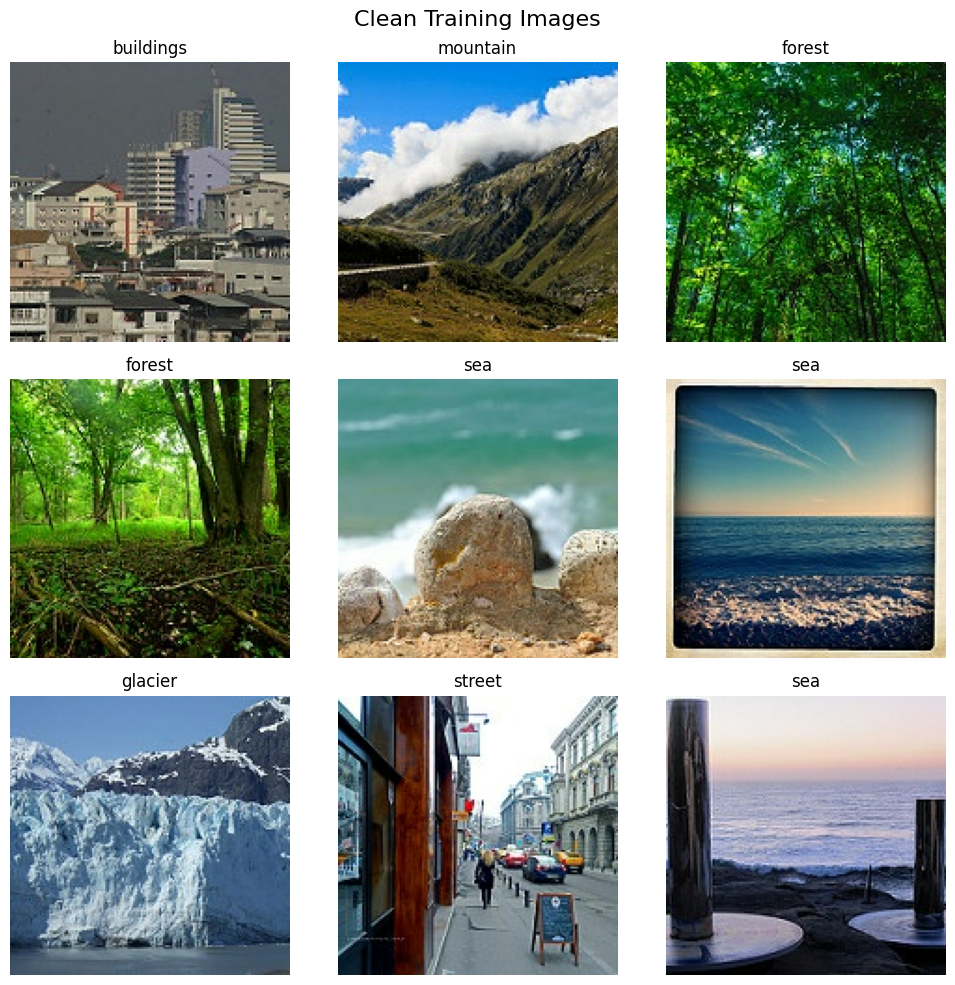

In [ ]:
def get_preprocessing_layers():
    data_augmentation = keras.Sequential([
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.08),
        layers.RandomZoom(0.10),
        layers.RandomContrast(0.10)
    ], name="data_augmentation")

    normalization_layer = layers.Rescaling(1./255, name="normalization")
    return data_augmentation, normalization_layer


def show_sample_images(dataset, title="Sample Images"):
    plt.figure(figsize=(10, 10))

    for images, labels in dataset.take(1):
        for i in range(9):
            label_index = int(np.argmax(labels[i].numpy()))
            plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(index_to_class[label_index])
            plt.axis("off")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


show_sample_images(train_ds_150, "Clean Training Images")

Exploratory Data Analysis (EDA)


In [ ]:
# Data Overview

total_images = len(clean_df)
train_count  = len(clean_df[clean_df["split"] == "train"])
test_count   = len(clean_df[clean_df["split"] == "test"])

print("=" * 50)
print(f"Dataset: Intel Scene Classification")
print(f"Total valid images  : {total_images:,}")
print(f"Training images     : {train_count:,}")
print(f"Test images         : {test_count:,}")
print(f"Number of classes   : {NUM_CLASSES}")
print(f"Classes             : {', '.join(CLASS_NAMES)}")
print("=" * 50)

# Per-split, per-class counts
overview_df = (
    clean_df
    .groupby(["split", "class"])
    .size()
    .reset_index(name="count")
    .pivot(index="class", columns="split", values="count")
    .fillna(0)
    .astype(int)
)
overview_df["total"] = overview_df.sum(axis=1)
overview_df = overview_df.sort_values("total", ascending=False)

print("\nImages per class and split:")
display(overview_df)


Dataset: Intel Scene Classification
Total valid images  : 16,992
Training images     : 13,992
Test images         : 3,000
Number of classes   : 6
Classes             : buildings, forest, glacier, mountain, sea, street

Images per class and split:


split,test,train,total
class,,,
mountain,525,2505,3030
glacier,553,2397,2950
street,501,2375,2876
sea,510,2267,2777
forest,474,2264,2738
buildings,437,2184,2621


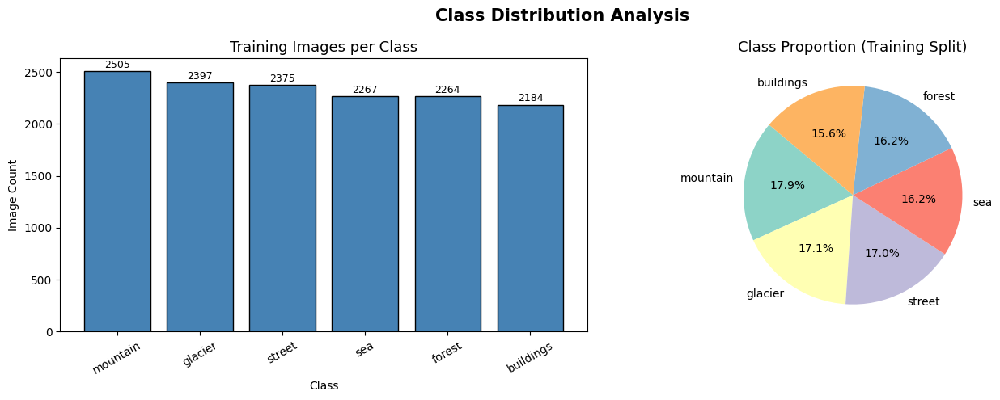


Class distribution summary:


,Class,Count,Percentage (%)
0,mountain,2505,17.90
1,glacier,2397,17.13
2,street,2375,16.97
3,sea,2267,16.20
4,forest,2264,16.18
5,buildings,2184,15.61



Dataset balance assessment: Balanced
Max class count: 2505, Min class count: 2184


In [ ]:
# Class Distribution Bar Chart

train_class_counts = (
    clean_df[clean_df["split"] == "train"]
    .groupby("class")
    .size()
    .sort_values(ascending=False)
)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar chart
axes[0].bar(train_class_counts.index, train_class_counts.values, color="steelblue", edgecolor="black")
axes[0].set_title("Training Images per Class", fontsize=13)
axes[0].set_xlabel("Class")
axes[0].set_ylabel("Image Count")
axes[0].tick_params(axis="x", rotation=30)
for idx, val in enumerate(train_class_counts.values):
    axes[0].text(idx, val + 10, str(val), ha="center", va="bottom", fontsize=9)

# Pie chart — proportion
axes[1].pie(
    train_class_counts.values,
    labels=train_class_counts.index,
    autopct="%1.1f%%",
    startangle=140,
    colors=plt.cm.Set3.colors[:NUM_CLASSES]
)
axes[1].set_title("Class Proportion (Training Split)", fontsize=13)

plt.suptitle("Class Distribution Analysis", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()

# Print percentage table
pct_df = pd.DataFrame({
    "Class": train_class_counts.index,
    "Count": train_class_counts.values,
    "Percentage (%)": (train_class_counts.values / train_class_counts.sum() * 100).round(2)
})
print("\nClass distribution summary:")
display(pct_df.reset_index(drop=True))

is_balanced = train_class_counts.max() / train_class_counts.min() < 1.5
print(f"\nDataset balance assessment: {'Balanced' if is_balanced else 'Imbalanced'}")
print(f"Max class count: {train_class_counts.max()}, Min class count: {train_class_counts.min()}")


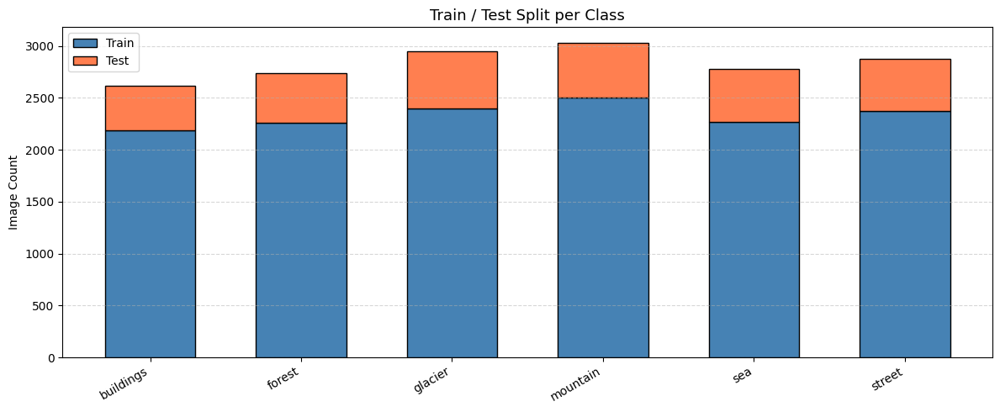

In [ ]:
# Train vs Test split per class (Stacked Bar)

train_counts = (
    clean_df[clean_df["split"] == "train"]
    .groupby("class").size().reindex(CLASS_NAMES, fill_value=0)
)
test_counts = (
    clean_df[clean_df["split"] == "test"]
    .groupby("class").size().reindex(CLASS_NAMES, fill_value=0)
)

x = np.arange(NUM_CLASSES)
width = 0.6

fig, ax = plt.subplots(figsize=(12, 5))
bars_train = ax.bar(x, train_counts.values, width, label="Train", color="steelblue", edgecolor="black")
bars_test  = ax.bar(x, test_counts.values, width, bottom=train_counts.values, label="Test", color="coral", edgecolor="black")

ax.set_xticks(x)
ax.set_xticklabels(CLASS_NAMES, rotation=30, ha="right")
ax.set_ylabel("Image Count")
ax.set_title("Train / Test Split per Class", fontsize=13)
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


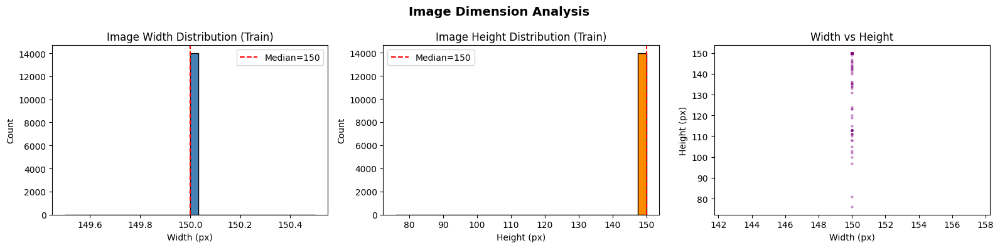


Dimension statistics (training set):
         width   height
count  13992.0  13992.0
mean     150.0    149.9
std        0.0      1.9
min      150.0     76.0
25%      150.0    150.0
50%      150.0    150.0
75%      150.0    150.0
max      150.0    150.0

All images same size: False


In [ ]:
# Image Dimension Statistics

dim_df = clean_df[clean_df["split"] == "train"].copy()

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Width histogram
axes[0].hist(dim_df["width"], bins=30, color="steelblue", edgecolor="black")
axes[0].set_title("Image Width Distribution (Train)")
axes[0].set_xlabel("Width (px)")
axes[0].set_ylabel("Count")
axes[0].axvline(dim_df["width"].median(), color="red", linestyle="--", label=f"Median={dim_df['width'].median():.0f}")
axes[0].legend()

# Height histogram
axes[1].hist(dim_df["height"], bins=30, color="darkorange", edgecolor="black")
axes[1].set_title("Image Height Distribution (Train)")
axes[1].set_xlabel("Height (px)")
axes[1].set_ylabel("Count")
axes[1].axvline(dim_df["height"].median(), color="red", linestyle="--", label=f"Median={dim_df['height'].median():.0f}")
axes[1].legend()

# Scatter: width vs height
axes[2].scatter(dim_df["width"], dim_df["height"], alpha=0.3, s=5, color="purple")
axes[2].set_title("Width vs Height")
axes[2].set_xlabel("Width (px)")
axes[2].set_ylabel("Height (px)")

plt.suptitle("Image Dimension Analysis", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# Summary statistics
print("\nDimension statistics (training set):")
print(dim_df[["width", "height"]].describe().round(1))
print(f"\nAll images same size: {(dim_df['width'].nunique() == 1 and dim_df['height'].nunique() == 1)}")


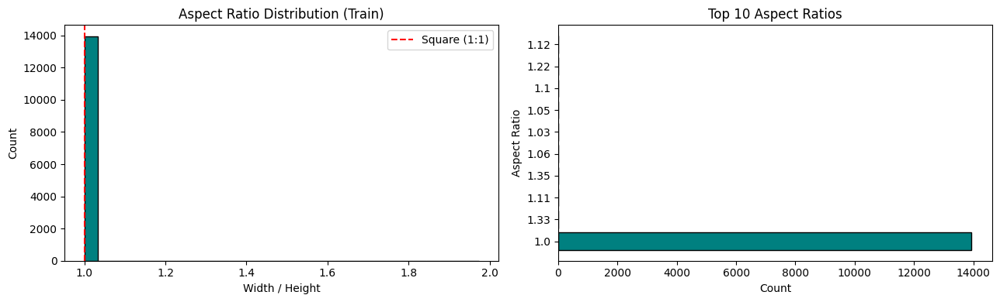


Aspect ratio summary:
count    13992.000
mean         1.001
std          0.019
min          1.000
25%          1.000
50%          1.000
75%          1.000
max          1.974
Name: aspect_ratio, dtype: float64


In [ ]:
# Aspect Ratio Analysis

dim_df = clean_df[clean_df["split"] == "train"].copy()
dim_df["aspect_ratio"] = dim_df["width"] / dim_df["height"]

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

axes[0].hist(dim_df["aspect_ratio"], bins=30, color="teal", edgecolor="black")
axes[0].axvline(1.0, color="red", linestyle="--", label="Square (1:1)")
axes[0].set_title("Aspect Ratio Distribution (Train)")
axes[0].set_xlabel("Width / Height")
axes[0].set_ylabel("Count")
axes[0].legend()

aspect_counts = dim_df["aspect_ratio"].round(2).value_counts().head(10)
axes[1].barh(aspect_counts.index.astype(str), aspect_counts.values, color="teal", edgecolor="black")
axes[1].set_title("Top 10 Aspect Ratios")
axes[1].set_xlabel("Count")
axes[1].set_ylabel("Aspect Ratio")

plt.tight_layout()
plt.show()

print("\nAspect ratio summary:")
print(dim_df["aspect_ratio"].describe().round(3))


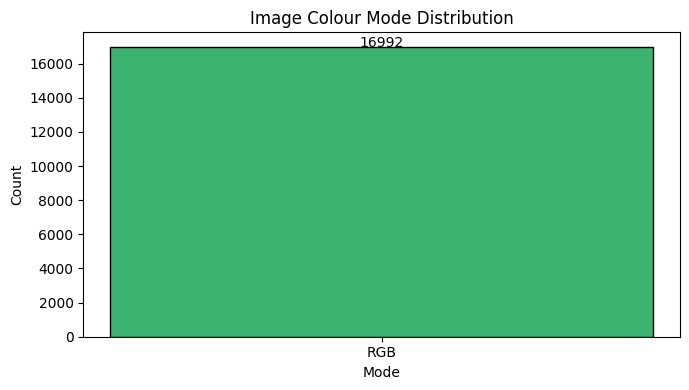


Colour mode counts:


,count,count
0,RGB,16992


In [ ]:
# Color Mode Breakdown

mode_counts = clean_df["mode"].value_counts()

fig, ax = plt.subplots(figsize=(7, 4))
ax.bar(mode_counts.index, mode_counts.values, color="mediumseagreen", edgecolor="black")
ax.set_title("Image Colour Mode Distribution")
ax.set_xlabel("Mode")
ax.set_ylabel("Count")
for i, val in enumerate(mode_counts.values):
    ax.text(i, val + 5, str(val), ha="center", fontsize=10)
plt.tight_layout()
plt.show()

print("\nColour mode counts:")
display(mode_counts.reset_index().rename(columns={"index": "mode", "mode": "count"}))


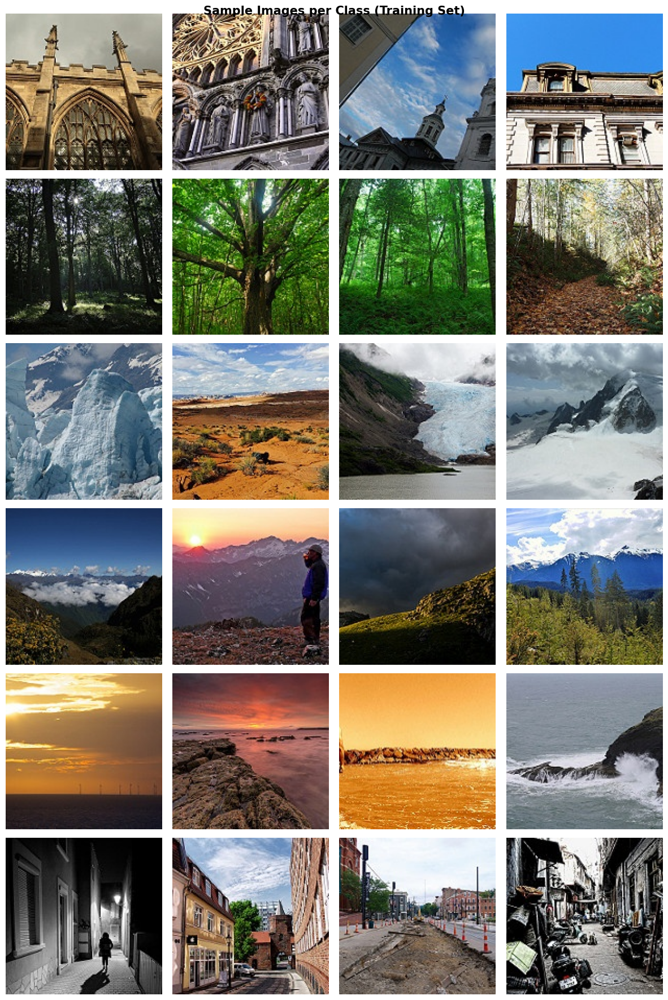

In [ ]:
# Sample Images Per Class

SAMPLES_PER_CLASS = 4

fig, axes = plt.subplots(NUM_CLASSES, SAMPLES_PER_CLASS, figsize=(SAMPLES_PER_CLASS * 3, NUM_CLASSES * 3))

for row_idx, class_name in enumerate(CLASS_NAMES):
    class_paths = (
        clean_df[(clean_df["split"] == "train") & (clean_df["class"] == class_name)]
        ["path"]
        .sample(n=SAMPLES_PER_CLASS, random_state=SEED)
        .tolist()
    )

    for col_idx, img_path in enumerate(class_paths):
        img = Image.open(img_path).convert("RGB")
        ax = axes[row_idx][col_idx]
        ax.imshow(img)
        ax.axis("off")
        if col_idx == 0:
            ax.set_ylabel(class_name, fontsize=10, rotation=0, labelpad=60, va="center")

plt.suptitle("Sample Images per Class (Training Set)", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()


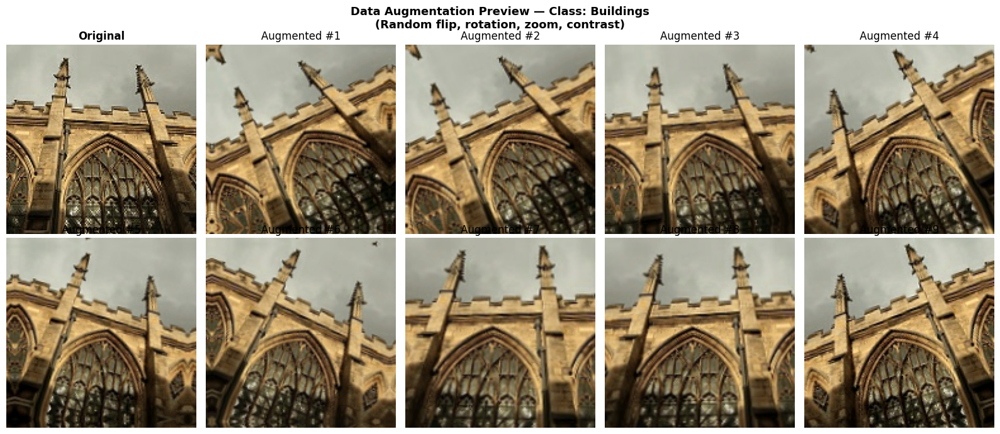

In [ ]:
# Augmentation Preview


# This shows how augmentation affects training images before feeding to the model.
data_augmentation, _ = get_preprocessing_layers()

train_class_paths = (
    clean_df[(clean_df["split"] == "train") & (clean_df["class"] == CLASS_NAMES[0])]
    ["path"]
    .sample(n=1, random_state=SEED)
    .values
)

sample_image = tf.io.read_file(train_class_paths[0])
sample_image = tf.io.decode_image(sample_image, channels=3, expand_animations=False)
sample_image.set_shape([None, None, 3])
sample_image = tf.image.resize(sample_image, SCRATCH_IMG_SIZE)

# Expand dims for batch dimension expected by augmentation layer
sample_batch = tf.expand_dims(sample_image, 0)

fig, axes = plt.subplots(2, 5, figsize=(16, 7))

# Original
axes[0][0].imshow(sample_image.numpy().astype("uint8"))
axes[0][0].set_title("Original", fontweight="bold")
axes[0][0].axis("off")

# 9 augmented variants
for i in range(9):
    row, col = divmod(i + 1, 5)
    augmented = data_augmentation(sample_batch, training=True)[0]
    axes[row][col].imshow(augmented.numpy().astype("uint8"))
    axes[row][col].set_title(f"Augmented #{i+1}")
    axes[row][col].axis("off")

plt.suptitle(
    f"Data Augmentation Preview — Class: {CLASS_NAMES[0].capitalize()}\n"
    "(Random flip, rotation, zoom, contrast)",
    fontsize=13, fontweight="bold"
)
plt.tight_layout()
plt.show()


## Helper Functions for Training, Evaluation, Plotting, and Saving Functions

In [ ]:
def get_callbacks(model_name, patience=5):
    checkpoint_path = OUTPUT_DIR / f"{model_name}_best.keras"

    callbacks = [
        keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=patience,
            restore_best_weights=True
        ),
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.3,
            patience=max(2, patience // 2),
            min_lr=1e-6
        ),
        keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            monitor="val_loss",
            save_best_only=True
        )
    ]
    return callbacks


def get_optimizer(name="adam", learning_rate=0.001):
    name = name.lower()

    if name == "adam":
        return keras.optimizers.Adam(learning_rate=learning_rate)

    if name == "sgd":
        return keras.optimizers.SGD(
            learning_rate=learning_rate,
            momentum=0.9,
            nesterov=True
        )

    raise ValueError("Supported optimizers: 'adam' or 'sgd'.")


def compile_model(model, optimizer_name="adam", learning_rate=0.001):
    model.compile(
        optimizer=get_optimizer(optimizer_name, learning_rate),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    return model


def train_model(model, train_ds, val_ds, model_name, epochs, optimizer_name="adam", learning_rate=0.001, patience=5):
    model = compile_model(model, optimizer_name=optimizer_name, learning_rate=learning_rate)

    start_time = time.time()
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=get_callbacks(model_name, patience=patience)
    )
    training_time = time.time() - start_time

    history_df = pd.DataFrame(history.history)
    history_df.to_csv(OUTPUT_DIR / f"{model_name}_history.csv", index=False)

    return model, history_df, training_time


def plot_history(history_df, title_prefix):
    plt.figure(figsize=(8, 5))
    plt.plot(history_df["accuracy"], label="Training Accuracy")
    plt.plot(history_df["val_accuracy"], label="Validation Accuracy")
    plt.title(f"{title_prefix}: Training vs Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(history_df["loss"], label="Training Loss")
    plt.plot(history_df["val_loss"], label="Validation Loss")
    plt.title(f"{title_prefix}: Training vs Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()


def collect_predictions(model, dataset):
    y_true = []
    y_pred = []

    for images, labels in dataset:
        predictions = model.predict(images, verbose=0)
        y_true.extend(np.argmax(labels.numpy(), axis=1))
        y_pred.extend(np.argmax(predictions, axis=1))

    return np.array(y_true), np.array(y_pred)


def evaluate_model(model, dataset, model_name):
    test_loss, test_accuracy = model.evaluate(dataset, verbose=1)
    y_true, y_pred = collect_predictions(model, dataset)

    report = classification_report(
        y_true,
        y_pred,
        labels=np.arange(NUM_CLASSES),
        target_names=CLASS_NAMES,
        output_dict=True,
        zero_division=0
    )
    report_df = pd.DataFrame(report).transpose()
    report_df.to_csv(OUTPUT_DIR / f"{model_name}_classification_report.csv")

    print("\nClassification Report:")
    print(classification_report(
        y_true,
        y_pred,
        labels=np.arange(NUM_CLASSES),
        target_names=CLASS_NAMES,
        zero_division=0
    ))

    cm = confusion_matrix(y_true, y_pred, labels=np.arange(NUM_CLASSES))
    fig, ax = plt.subplots(figsize=(9, 9))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=CLASS_NAMES)
    disp.plot(ax=ax, values_format="d")
    plt.title(f"{model_name}: Confusion Matrix")
    plt.xticks(rotation=45)
    plt.show()

    metrics = {
        "model": model_name,
        "test_accuracy": float(test_accuracy),
        "test_loss": float(test_loss),
        "macro_f1": float(report_df.loc["macro avg", "f1-score"]),
        "weighted_f1": float(report_df.loc["weighted avg", "f1-score"])
    }

    return metrics, report_df, cm


def plot_sample_predictions(model, dataset, model_name, number=9):
    plt.figure(figsize=(12, 12))

    for images, labels in dataset.take(1):
        predictions = model.predict(images, verbose=0)

        for i in range(min(number, len(images))):
            true_index = int(np.argmax(labels[i].numpy()))
            pred_index = int(np.argmax(predictions[i]))
            confidence = float(np.max(predictions[i]) * 100)

            true_label = index_to_class[true_index]
            pred_label = index_to_class[pred_index]

            plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(f"True: {true_label}\nPred: {pred_label} ({confidence:.1f}%)")
            plt.axis("off")

    plt.suptitle(f"{model_name}: Sample Predictions", fontsize=16)
    plt.tight_layout()
    plt.show()


def save_model(model, model_name):
    model_path = OUTPUT_DIR / f"{model_name}.keras"
    model.save(model_path)
    print("Saved model to:", model_path)


def add_result(results, model, metrics, training_time_seconds):
    results.append({
        "Model": metrics["model"],
        "Test Accuracy": metrics["test_accuracy"],
        "Test Loss": metrics["test_loss"],
        "Macro F1": metrics["macro_f1"],
        "Weighted F1": metrics["weighted_f1"],
        "Training Time (minutes)": training_time_seconds / 60,
        "Parameters": model.count_params()
    })
    return results


def plot_metric_comparison(comparison_df, metric, title):
    plt.figure(figsize=(8, 5))
    plt.bar(comparison_df["Model"], comparison_df[metric])
    plt.title(title)
    plt.ylabel(metric)
    plt.xticks(rotation=30, ha="right")
    if "Accuracy" in metric or "F1" in metric:
        plt.ylim(0, 1)
    plt.grid(axis="y")
    plt.tight_layout()
    plt.show()

## Model Builder Functions

Baseline model:
1. 3 Convolutional Layers
2. 3 pooling layers
3. 3 fully connected layers
4. A softmax output layer.

Deeper model:
approximately doubles the convolutional depth and adds regularization. GlobalAveragePooling2D is used in the deeper model to reduce parameters and overfitting compared with a large Flatten layer.

In [ ]:
def build_baseline_cnn(input_shape=(150, 150, 3), num_classes=NUM_CLASSES):
    data_augmentation, normalization_layer = get_preprocessing_layers()

    model = keras.Sequential([
        layers.Input(shape=input_shape),
        data_augmentation,
        normalization_layer,

        layers.Conv2D(32, (3, 3), activation="relu"),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(64, (3, 3), activation="relu"),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(128, (3, 3), activation="relu"),
        layers.MaxPooling2D((2, 2)),

        layers.Flatten(),

        layers.Dense(256, activation="relu"),
        layers.Dense(128, activation="relu"),
        layers.Dense(64, activation="relu"),

        layers.Dense(num_classes, activation="softmax")
    ], name="Baseline_CNN")

    return model


def conv_block(model, filters, use_batch_norm=True, use_dropout=True, dropout_rate=0.25, l2_value=0.001):
    model.add(layers.Conv2D(
        filters, (3, 3), padding="same", activation="relu",
        kernel_regularizer=regularizers.l2(l2_value)
    ))
    if use_batch_norm:
        model.add(layers.BatchNormalization())

    model.add(layers.Conv2D(
        filters, (3, 3), padding="same", activation="relu",
        kernel_regularizer=regularizers.l2(l2_value)
    ))
    if use_batch_norm:
        model.add(layers.BatchNormalization())

    model.add(layers.MaxPooling2D((2, 2)))
    if use_dropout:
        model.add(layers.Dropout(dropout_rate))

    return model


def build_deeper_cnn(
    input_shape=(150, 150, 3),
    num_classes=NUM_CLASSES,
    use_batch_norm=True,
    use_dropout=True,
    l2_value=0.001,
    model_name="Deeper_CNN"
):
    data_augmentation, normalization_layer = get_preprocessing_layers()

    model = keras.Sequential(name=model_name)
    model.add(layers.Input(shape=input_shape))
    model.add(data_augmentation)
    model.add(normalization_layer)

    model = conv_block(model, 32, use_batch_norm, use_dropout, 0.20, l2_value)
    model = conv_block(model, 64, use_batch_norm, use_dropout, 0.25, l2_value)
    model = conv_block(model, 128, use_batch_norm, use_dropout, 0.30, l2_value)

    model.add(layers.GlobalAveragePooling2D())

    model.add(layers.Dense(
        256, activation="relu",
        kernel_regularizer=regularizers.l2(l2_value)
    ))
    if use_batch_norm:
        model.add(layers.BatchNormalization())
    if use_dropout:
        model.add(layers.Dropout(0.50))

    model.add(layers.Dense(
        128, activation="relu",
        kernel_regularizer=regularizers.l2(l2_value)
    ))
    if use_batch_norm:
        model.add(layers.BatchNormalization())
    if use_dropout:
        model.add(layers.Dropout(0.40))

    model.add(layers.Dense(64, activation="relu"))
    model.add(layers.Dense(num_classes, activation="softmax"))

    return model

Training Configuration


In [ ]:
BASELINE_EPOCHS = 15
DEEPER_EPOCHS = 20
SGD_EPOCHS = DEEPER_EPOCHS
ABLATION_EPOCHS = DEEPER_EPOCHS

results = []

print("Baseline epochs:", BASELINE_EPOCHS)
print("Deeper epochs:", DEEPER_EPOCHS)
print("SGD experiment epochs:", SGD_EPOCHS)
print("Ablation epochs:", ABLATION_EPOCHS)

Baseline epochs: 15
Deeper epochs: 20
SGD experiment epochs: 20
Ablation epochs: 20


# Baseline CNN From Scratch



In [ ]:
# Build or Resume Baseline CNN

baseline_final    = OUTPUT_DIR / "baseline_cnn_final.keras"
baseline_history_path = OUTPUT_DIR / "baseline_cnn_history.csv"

if baseline_final.exists():
    print("Baseline final model found. Loading from Drive...")
    baseline_model       = keras.models.load_model(baseline_final)
    baseline_history_df  = pd.read_csv(baseline_history_path)
    baseline_training_time = 0
else:
    print("Building Baseline CNN from scratch...")
    baseline_model = build_baseline_cnn()

baseline_model.summary()


Building Baseline CNN from scratch...


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)  │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalization (Rescaling)       │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     9,470,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,604,998 (36.64 MB)

 Trainable params: 9,604,998 (36.64 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 54s 133ms/step - accuracy: 0.5484 - loss: 1.1301 - val_accuracy: 0.6088 - val_loss: 0.9977 - learning_rate: 0.0010
Epoch 2/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - accuracy: 0.6853 - loss: 0.8427 - val_accuracy: 0.7306 - val_loss: 0.7194 - learning_rate: 0.0010
Epoch 3/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 49s 140ms/step - accuracy: 0.7340 - loss: 0.7276 - val_accuracy: 0.7485 - val_loss: 0.6731 - learning_rate: 0.0010
Epoch 4/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 77s 126ms/step - accuracy: 0.7643 - loss: 0.6399 - val_accuracy: 0.7671 - val_loss: 0.6405 - learning_rate: 0.0010
Epoch 5/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 81s 123ms/step - accuracy: 0.7800 - loss: 0.6017 - val_accuracy: 0.7928 - val_loss: 0.5892 - learning_rate: 0.0010
Epoch 6/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - accuracy: 0.7978 - loss: 0.5565 - val_accuracy: 0.7864 - val_loss: 0.6019 - learning_rate: 0.0010
Epoch 7/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - accuracy: 0.8

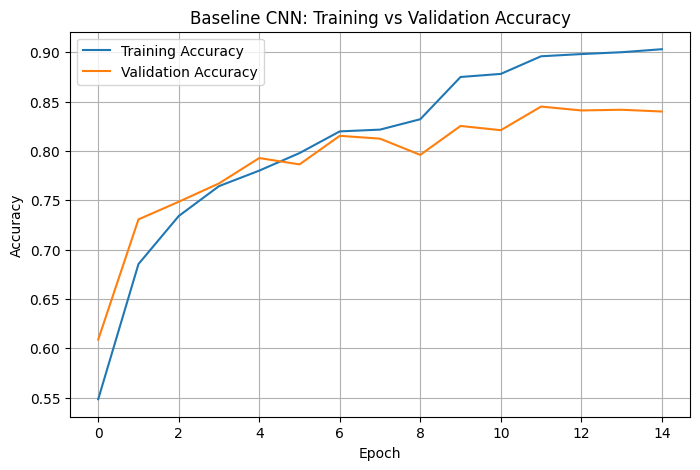

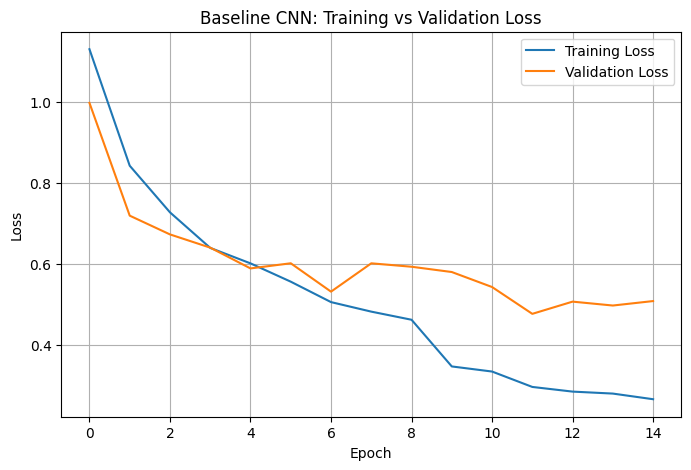

In [ ]:
baseline_model, baseline_history_df, baseline_training_time = train_model(
    model=baseline_model,
    train_ds=train_ds_150,
    val_ds=val_ds_150,
    model_name="baseline_cnn",
    epochs=BASELINE_EPOCHS,
    optimizer_name="adam",
    learning_rate=0.001,
    patience=5
)

print("Baseline training time minutes:", round(baseline_training_time / 60, 2))
plot_history(baseline_history_df, "Baseline CNN")

94/94 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - accuracy: 0.8453 - loss: 0.4630

Classification Report:
              precision    recall  f1-score   support

   buildings       0.76      0.87      0.81       437
      forest       0.94      0.97      0.96       474
     glacier       0.86      0.75      0.80       553
    mountain       0.80      0.79      0.80       525
         sea       0.84      0.86      0.85       510
      street       0.87      0.84      0.85       501

    accuracy                           0.85      3000
   macro avg       0.85      0.85      0.85      3000
weighted avg       0.85      0.85      0.84      3000



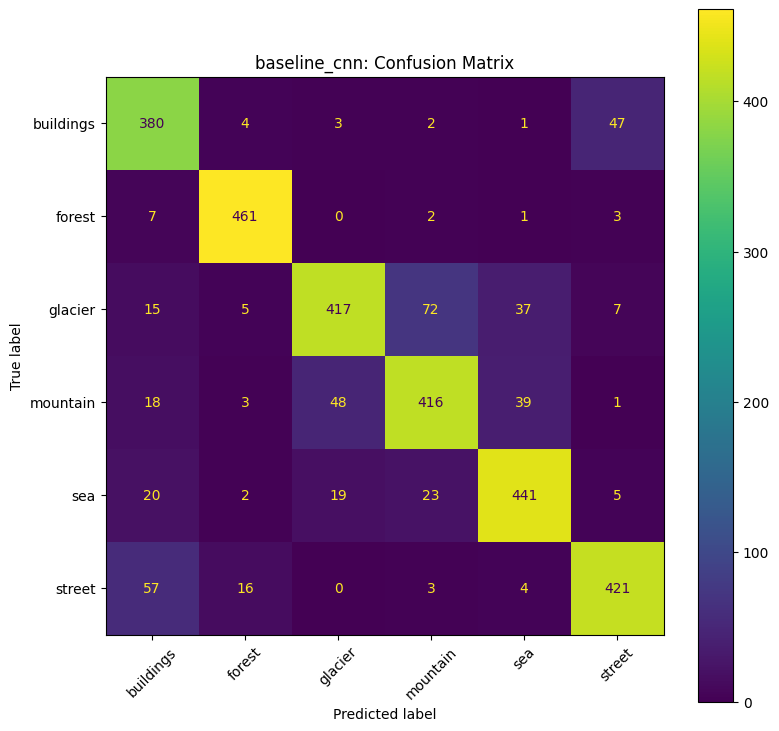

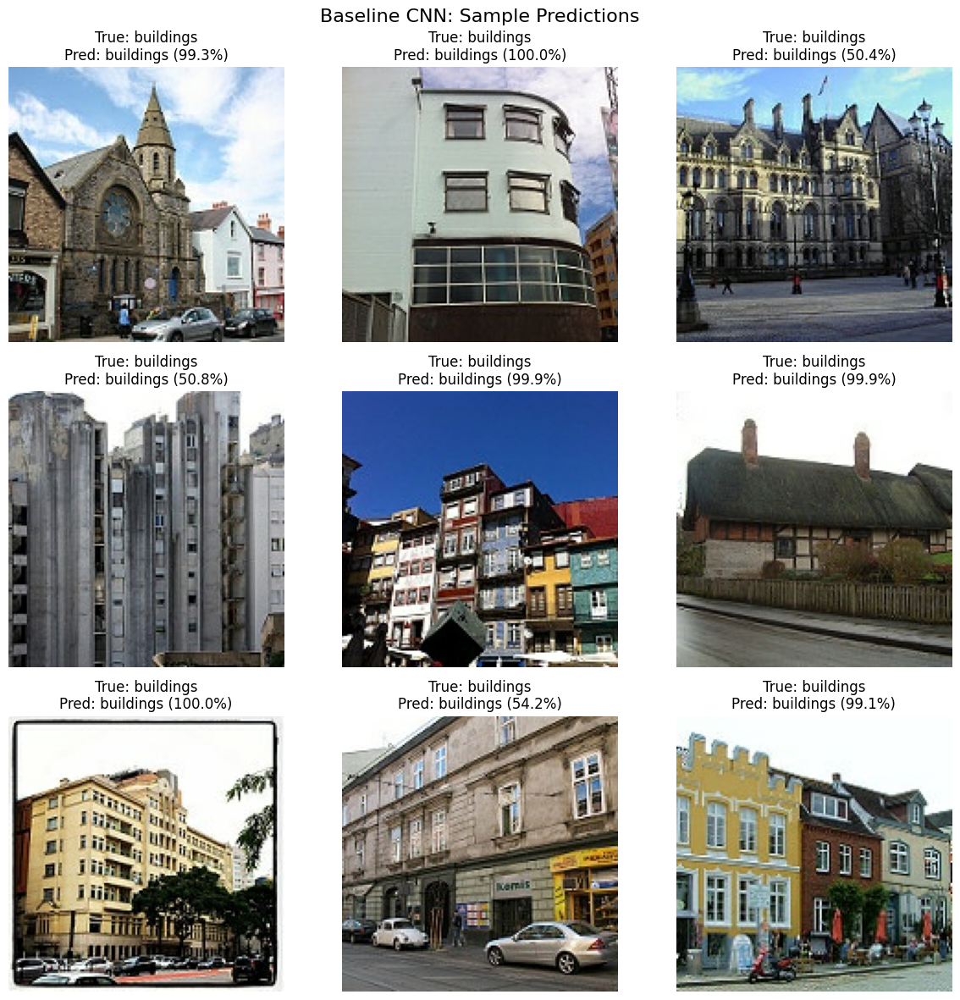

Saved model to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/baseline_cnn_final.keras


In [ ]:
# Testing the baseline CNN on test_ds_150

baseline_metrics, baseline_report_df, baseline_cm = evaluate_model(
    baseline_model,
    test_ds_150,
    "baseline_cnn"
)

plot_sample_predictions(baseline_model, test_ds_150, "Baseline CNN")
save_model(baseline_model, "baseline_cnn_final")
results = add_result(results, baseline_model, baseline_metrics, baseline_training_time)

# Deeper CNN With Regularization

Control overfitting using Batch Normalization, Dropout, L2 regularization, EarlyStopping, and ReduceLROnPlateau.

No checkpoint. Building from scratch...
Epoch 1/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 74s 183ms/step - accuracy: 0.5045 - loss: 1.9488 - val_accuracy: 0.2186 - val_loss: 3.3948 - learning_rate: 0.0010
Epoch 2/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 61s 174ms/step - accuracy: 0.6275 - loss: 1.5710 - val_accuracy: 0.6427 - val_loss: 1.4755 - learning_rate: 0.0010
Epoch 3/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 82s 174ms/step - accuracy: 0.6893 - loss: 1.3634 - val_accuracy: 0.5834 - val_loss: 1.5686 - learning_rate: 0.0010
Epoch 4/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 60s 172ms/step - accuracy: 0.7238 - loss: 1.1987 - val_accuracy: 0.6252 - val_loss: 1.4900 - learning_rate: 0.0010
Epoch 5/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 61s 173ms/step - accuracy: 0.7790 - loss: 1.0144 - val_accuracy: 0.7453 - val_loss: 1.0664 - learning_rate: 3.0000e-04
Epoch 6/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 61s 173ms/step - accuracy: 0.8022 - loss: 0.9306 - val_accuracy: 0.7310 - val_loss: 1.1107 - learning_rate: 3.0000e-04
Epoch 7/20
350/350 ━━━

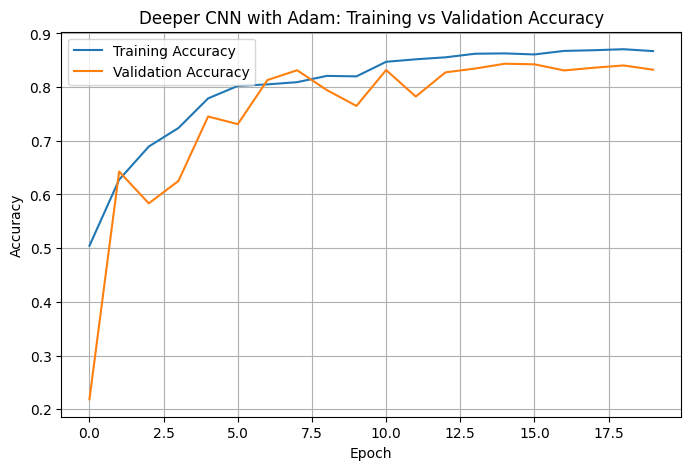

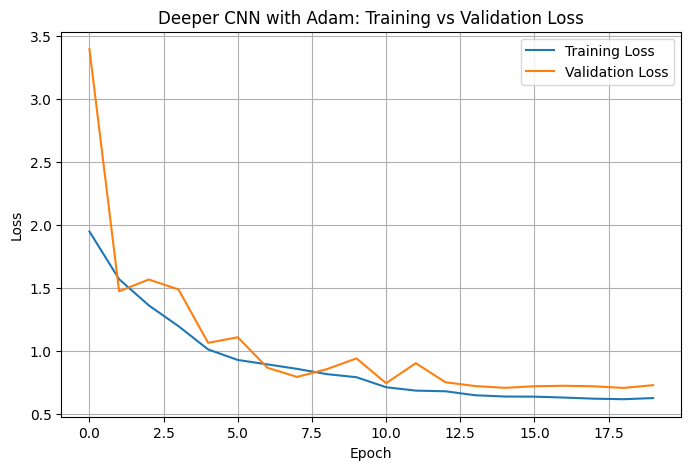

In [ ]:
checkpoint_path = OUTPUT_DIR / "deeper_cnn_adam_best.keras"

if checkpoint_path.exists():
    print("Checkpoint found. Loading weights from Drive...")
    deeper_model = keras.models.load_model(checkpoint_path)
else:
    print("No checkpoint. Building from scratch...")
    deeper_model = build_deeper_cnn(
        use_batch_norm=True,
        use_dropout=True,
        l2_value=0.001,
        model_name="Deeper_CNN_Adam"
    )

deeper_model, deeper_history_df, deeper_training_time = train_model(
    model=deeper_model,
    train_ds=train_ds_150,
    val_ds=val_ds_150,
    model_name="deeper_cnn_adam",
    epochs=DEEPER_EPOCHS,
    optimizer_name="adam",
    learning_rate=0.001,
    patience=5
)

print("Deeper CNN training time minutes:", round(deeper_training_time / 60, 2))
plot_history(deeper_history_df, "Deeper CNN with Adam")

94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - accuracy: 0.8363 - loss: 0.7112

Classification Report:
              precision    recall  f1-score   support

   buildings       0.77      0.87      0.82       437
      forest       0.93      0.98      0.95       474
     glacier       0.82      0.77      0.79       553
    mountain       0.84      0.74      0.78       525
         sea       0.78      0.90      0.84       510
      street       0.90      0.78      0.84       501

    accuracy                           0.84      3000
   macro avg       0.84      0.84      0.84      3000
weighted avg       0.84      0.84      0.84      3000



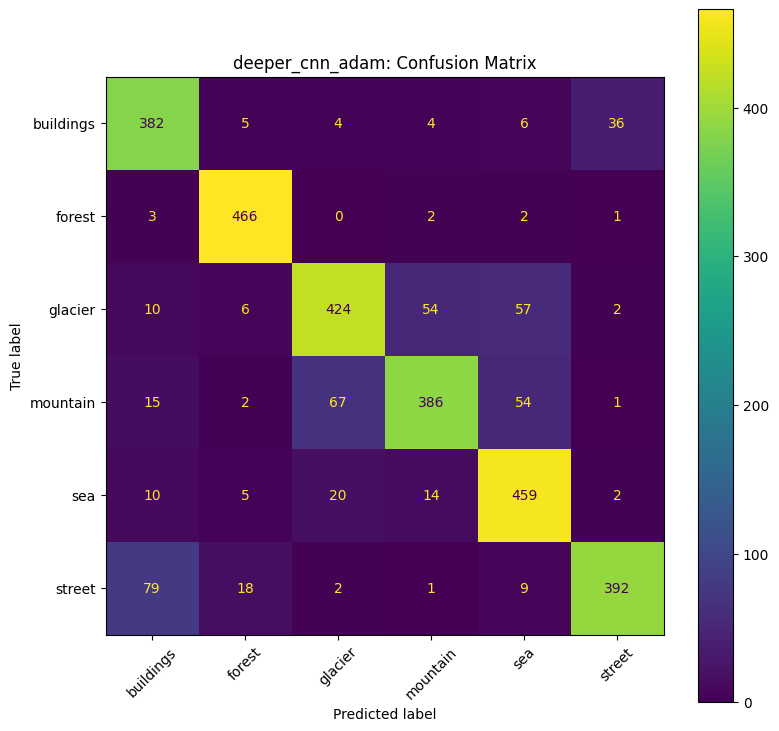

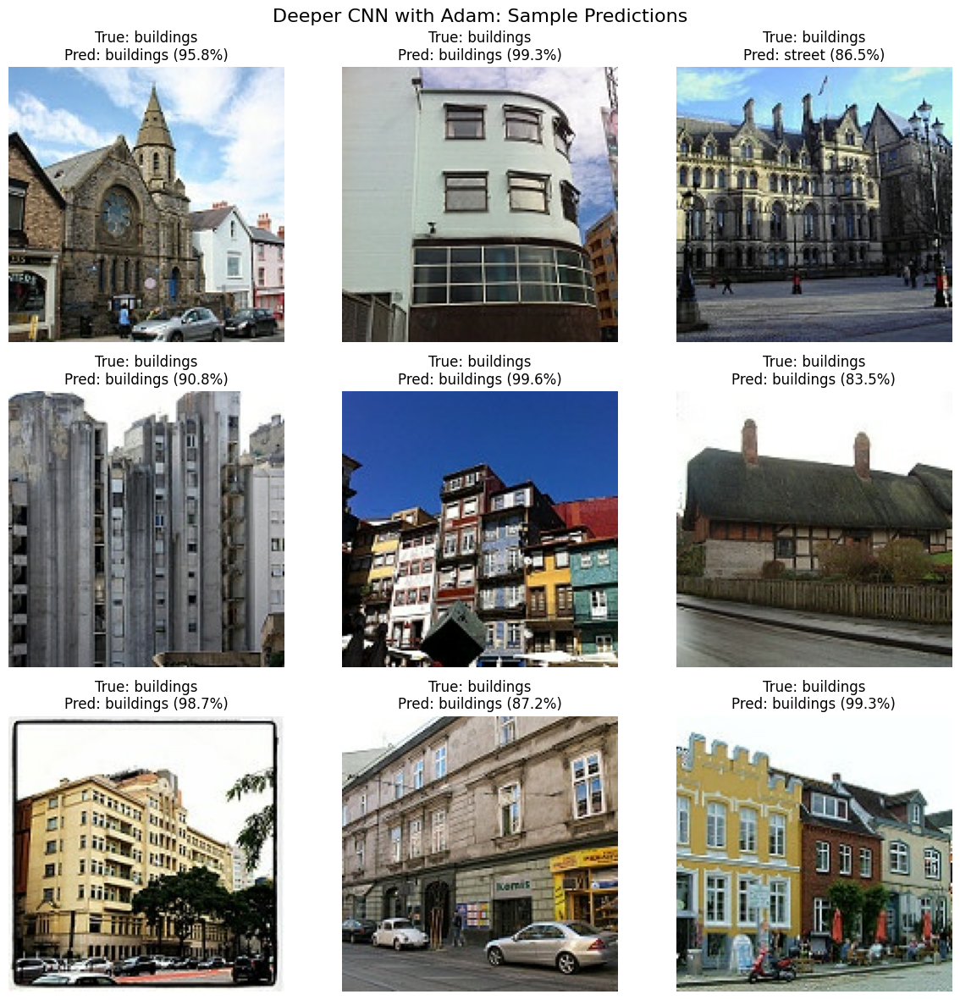

Saved model to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/deeper_cnn_adam_final.keras


In [ ]:
deeper_metrics, deeper_report_df, deeper_cm = evaluate_model(
    deeper_model,
    test_ds_150,
    "deeper_cnn_adam"
)

plot_sample_predictions(deeper_model, test_ds_150, "Deeper CNN with Adam")
save_model(deeper_model, "deeper_cnn_adam_final")
results = add_result(results, deeper_model, deeper_metrics, deeper_training_time)

## Baseline vs Deeper CNN Comparison

This comparison addresses model complexity, accuracy, loss, F1-score, parameter count, and training time.

,Model,Test Accuracy,Test Loss,Macro F1,Weighted F1,Training Time (minutes),Parameters
0,baseline_cnn,0.845333,0.463029,0.846236,0.844813,13.148989,9604998
1,deeper_cnn_adam,0.836333,0.711210,0.836995,0.835173,22.224266,364902


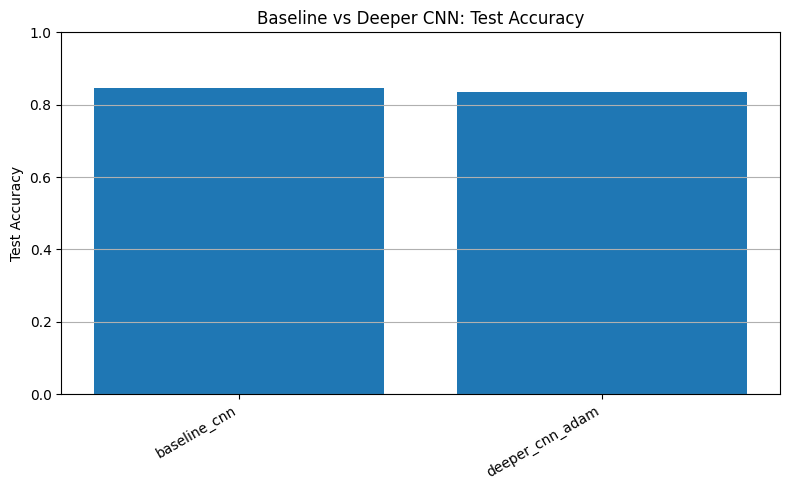

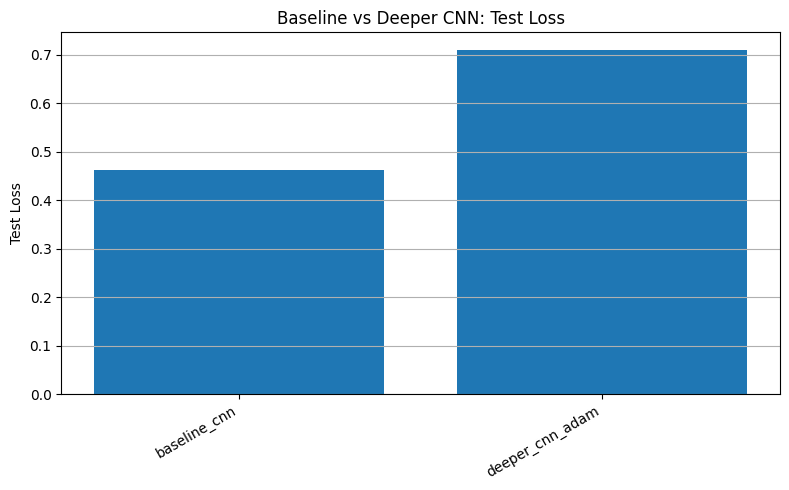

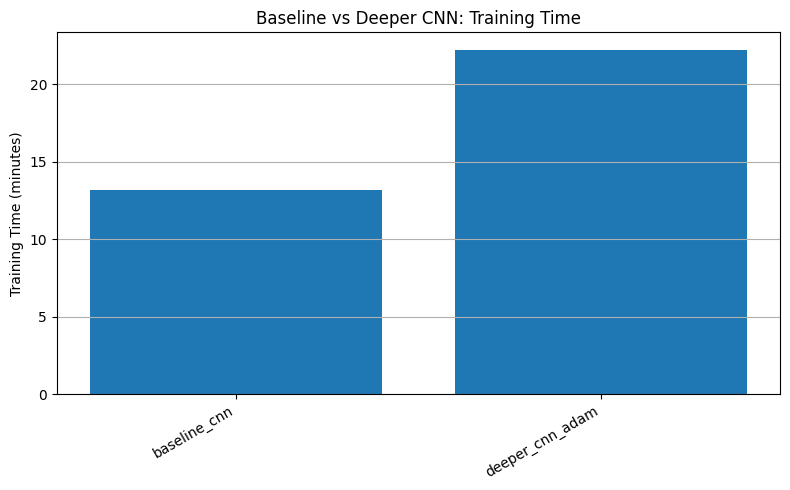

In [ ]:
comparison_df = pd.DataFrame(results)
display(comparison_df)

plot_metric_comparison(comparison_df, "Test Accuracy", "Baseline vs Deeper CNN: Test Accuracy")
plot_metric_comparison(comparison_df, "Test Loss", "Baseline vs Deeper CNN: Test Loss")
plot_metric_comparison(comparison_df, "Training Time (minutes)", "Baseline vs Deeper CNN: Training Time")

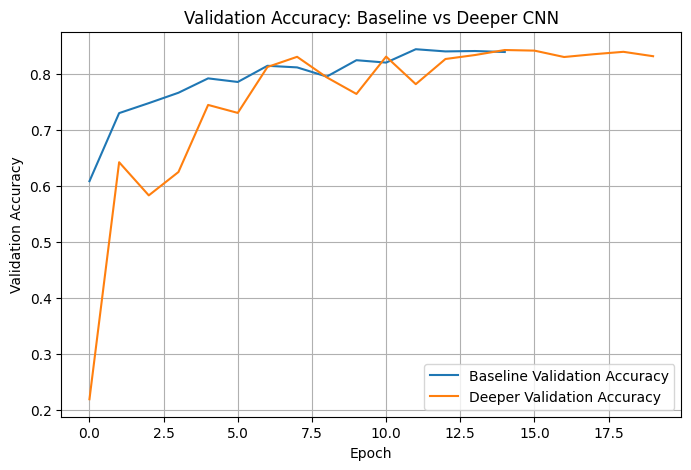

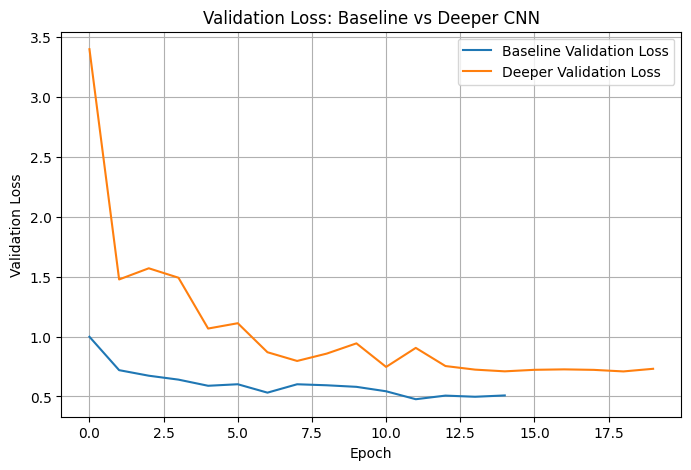

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(baseline_history_df["val_accuracy"], label="Baseline Validation Accuracy")
plt.plot(deeper_history_df["val_accuracy"], label="Deeper Validation Accuracy")
plt.title("Validation Accuracy: Baseline vs Deeper CNN")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(baseline_history_df["val_loss"], label="Baseline Validation Loss")
plt.plot(deeper_history_df["val_loss"], label="Deeper Validation Loss")
plt.title("Validation Loss: Baseline vs Deeper CNN")
plt.xlabel("Epoch")
plt.ylabel("Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

# Optimizer Comparison and Ablation Study

1. **Optimizer comparison:** The regularized deeper CNN trained with Adam is compared against the same architecture trained with SGD + momentum.
2. **Ablation study:** Dropout is removed from the deeper CNN to observe whether overfitting increases or generalization decreases.


## Optimizer Comparison: Adam vs SGD


Building SGD model from scratch...
Epoch 1/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 65s 171ms/step - accuracy: 0.4553 - loss: 2.1001 - val_accuracy: 0.2333 - val_loss: 2.8044 - learning_rate: 0.0010
Epoch 2/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 81s 168ms/step - accuracy: 0.5698 - loss: 1.7759 - val_accuracy: 0.5316 - val_loss: 1.9198 - learning_rate: 0.0010
Epoch 3/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 59s 168ms/step - accuracy: 0.6184 - loss: 1.6553 - val_accuracy: 0.3165 - val_loss: 3.3001 - learning_rate: 0.0010
Epoch 4/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 59s 168ms/step - accuracy: 0.6584 - loss: 1.5636 - val_accuracy: 0.3383 - val_loss: 3.0136 - learning_rate: 0.0010
Epoch 5/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 59s 168ms/step - accuracy: 0.6889 - loss: 1.4755 - val_accuracy: 0.5409 - val_loss: 2.0552 - learning_rate: 3.0000e-04
Epoch 6/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 82s 169ms/step - accuracy: 0.7048 - loss: 1.4473 - val_accuracy: 0.5866 - val_loss: 1.8991 - learning_rate: 3.0000e-04
Epoch 7/20
350/350 ━━━━━━━━

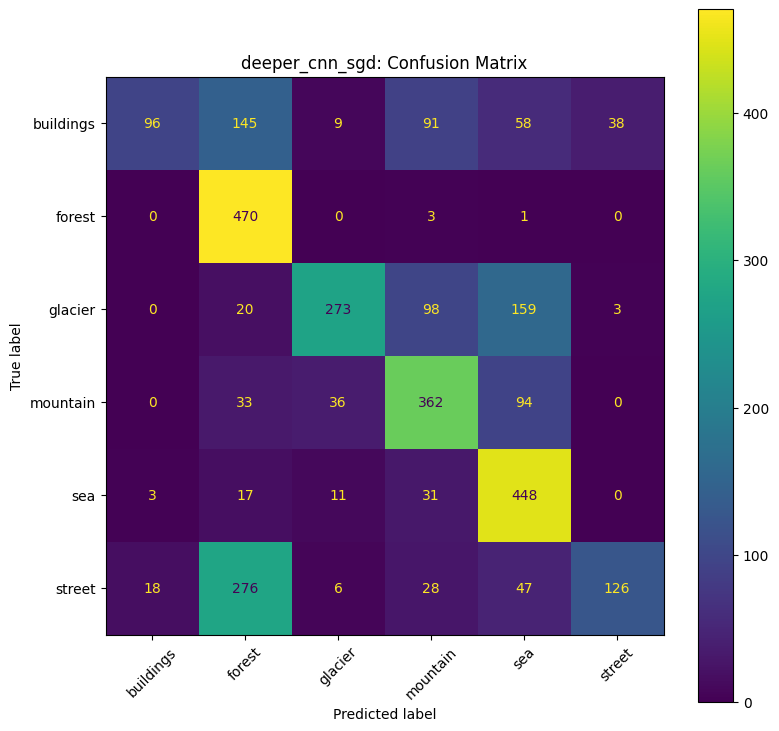

Saved model to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/deeper_cnn_sgd_final.keras


In [ ]:
sgd_final = OUTPUT_DIR / "deeper_cnn_sgd_final.keras"
sgd_history_path = OUTPUT_DIR / "deeper_cnn_sgd_history.csv"
sgd_checkpoint = OUTPUT_DIR / "deeper_cnn_sgd_best.keras"

if sgd_final.exists():
    print("SGD final model already trained. Loading...")
    sgd_model = keras.models.load_model(sgd_final)
    sgd_history_df = pd.read_csv(sgd_history_path)
    sgd_training_time = 0

elif sgd_checkpoint.exists():
    print("SGD checkpoint found. Loading and continuing training...")
    sgd_model = keras.models.load_model(sgd_checkpoint)

    sgd_model, sgd_history_df, sgd_training_time = train_model(
        model=sgd_model,
        train_ds=train_ds_150,
        val_ds=val_ds_150,
        model_name="deeper_cnn_sgd",
        epochs=DEEPER_EPOCHS,
        optimizer_name="sgd",
        learning_rate=0.001,
        patience=5
    )

else:
    print("Building SGD model from scratch...")
    sgd_model = build_deeper_cnn(
        use_batch_norm=True,
        use_dropout=True,
        l2_value=0.001,
        model_name="Deeper_CNN_SGD"
    )

    sgd_model, sgd_history_df, sgd_training_time = train_model(
        model=sgd_model,
        train_ds=train_ds_150,
        val_ds=val_ds_150,
        model_name="deeper_cnn_sgd",
        epochs=DEEPER_EPOCHS,
        optimizer_name="sgd",
        learning_rate=0.001,
        patience=5
    )

sgd_metrics, sgd_report_df, sgd_cm = evaluate_model(
    sgd_model,
    test_ds_150,
    "deeper_cnn_sgd"
)

save_model(sgd_model, "deeper_cnn_sgd_final")
results = add_result(results, sgd_model, sgd_metrics, sgd_training_time)

,Model,Test Accuracy,Test Loss,Macro F1,Weighted F1,Training Time (minutes),Parameters
0,deeper_cnn_adam,0.836333,0.71121,0.836995,0.835173,22.224266,364902
1,deeper_cnn_sgd,0.591667,1.85114,0.551712,0.557315,11.633593,364902


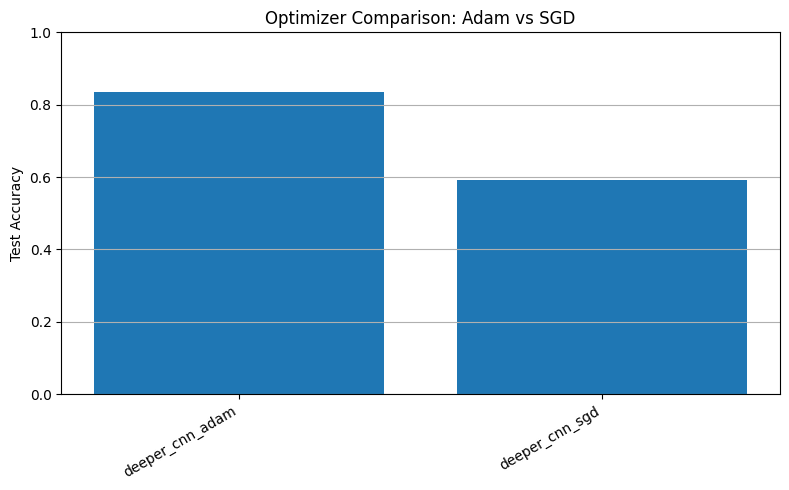

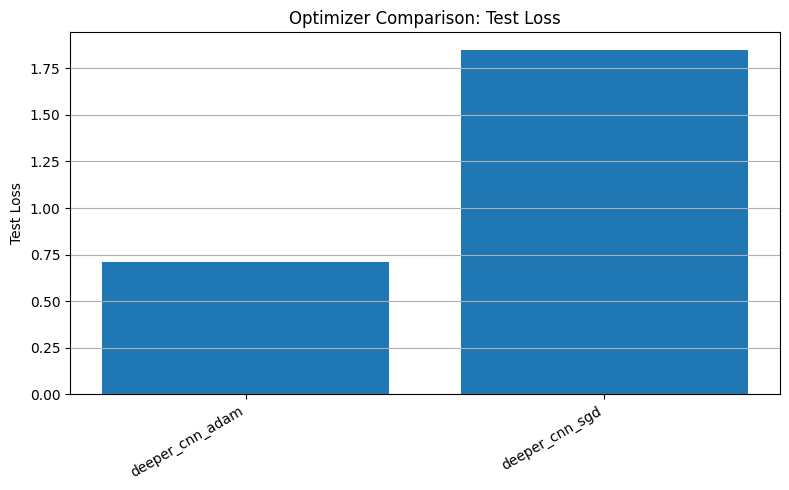

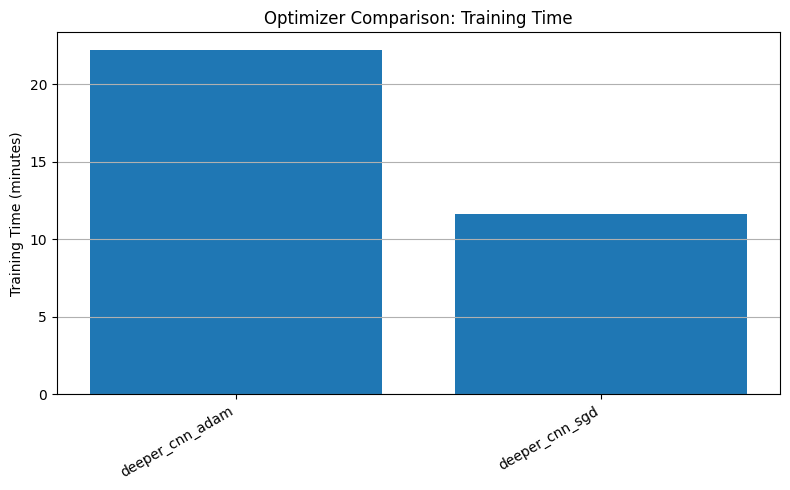

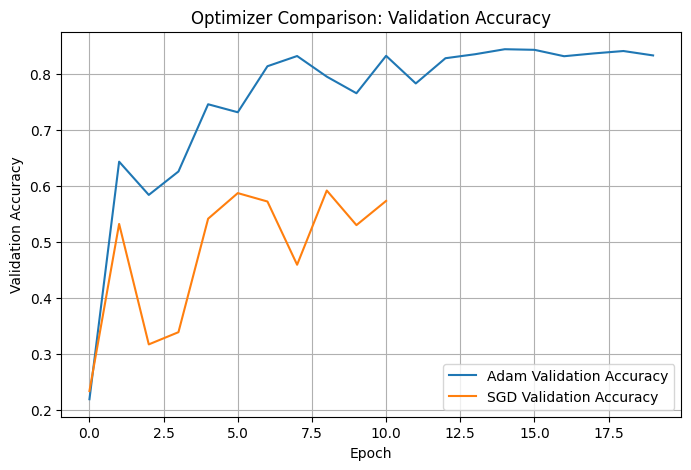

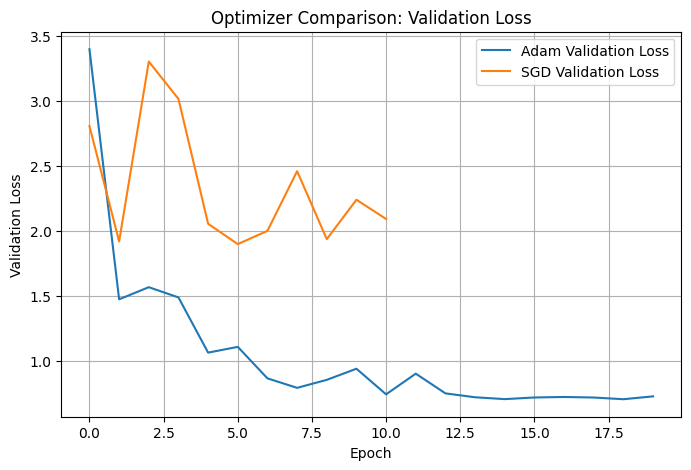

In [ ]:
optimizer_comparison_df = pd.DataFrame([
    results[1],  # deeper_cnn_adam
    results[2]   # deeper_cnn_sgd
])

display(optimizer_comparison_df)

plot_metric_comparison(optimizer_comparison_df, "Test Accuracy", "Optimizer Comparison: Adam vs SGD")
plot_metric_comparison(optimizer_comparison_df, "Test Loss", "Optimizer Comparison: Test Loss")
plot_metric_comparison(optimizer_comparison_df, "Training Time (minutes)", "Optimizer Comparison: Training Time")

plt.figure(figsize=(8, 5))
plt.plot(deeper_history_df["val_accuracy"], label="Adam Validation Accuracy")
plt.plot(sgd_history_df["val_accuracy"], label="SGD Validation Accuracy")
plt.title("Optimizer Comparison: Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(deeper_history_df["val_loss"], label="Adam Validation Loss")
plt.plot(sgd_history_df["val_loss"], label="SGD Validation Loss")
plt.title("Optimizer Comparison: Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

## Ablation Study: Removing Dropout

The model implements the same deeper CNN structure, Batch Normalization, and L2 regularization, but removes Dropout. This isolates the contribution of Dropout to generalization.

In [ ]:
ablation_model = build_deeper_cnn(
    use_batch_norm=True,
    use_dropout=False,
    l2_value=0.001,
    model_name="Ablation_No_Dropout"
)

ablation_model.summary()

Model: "Ablation_No_Dropout"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)  │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalization (Rescaling)       │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 150, 150, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 37, 37, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 128)            │        32,89

 Total params: 364,902 (1.39 MB)

 Trainable params: 363,238 (1.39 MB)

 Non-trainable params: 1,664 (6.50 KB)

Building ablation model from scratch...
Epoch 1/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 62s 162ms/step - accuracy: 0.6003 - loss: 1.7117 - val_accuracy: 0.3058 - val_loss: 2.7641 - learning_rate: 0.0010
Epoch 2/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 82s 163ms/step - accuracy: 0.7049 - loss: 1.3656 - val_accuracy: 0.5656 - val_loss: 1.7114 - learning_rate: 0.0010
Epoch 3/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - accuracy: 0.7445 - loss: 1.1588 - val_accuracy: 0.7042 - val_loss: 1.1913 - learning_rate: 0.0010
Epoch 4/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - accuracy: 0.7693 - loss: 1.0078 - val_accuracy: 0.5420 - val_loss: 1.7707 - learning_rate: 0.0010
Epoch 5/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - accuracy: 0.7805 - loss: 0.9149 - val_accuracy: 0.6624 - val_loss: 1.1314 - learning_rate: 0.0010
Epoch 6/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - accuracy: 0.7944 - loss: 0.8394 - val_accuracy: 0.7624 - val_loss: 0.8903 - learning_rate: 0.0010
Epoch 7/20
350/350 ━━━━━━━━━━━

Model: "Ablation_No_Dropout"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)  │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalization (Rescaling)       │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 150, 150, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 37, 37, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_29          │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 128)            │        32,89

 Total params: 1,091,380 (4.16 MB)

 Trainable params: 363,238 (1.39 MB)

 Non-trainable params: 1,664 (6.50 KB)

 Optimizer params: 726,478 (2.77 MB)

94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.8633 - loss: 0.5181

Classification Report:
              precision    recall  f1-score   support

   buildings       0.76      0.93      0.84       437
      forest       0.97      0.97      0.97       474
     glacier       0.85      0.81      0.83       553
    mountain       0.87      0.76      0.81       525
         sea       0.84      0.91      0.87       510
      street       0.91      0.81      0.86       501

    accuracy                           0.86      3000
   macro avg       0.87      0.87      0.86      3000
weighted avg       0.87      0.86      0.86      3000



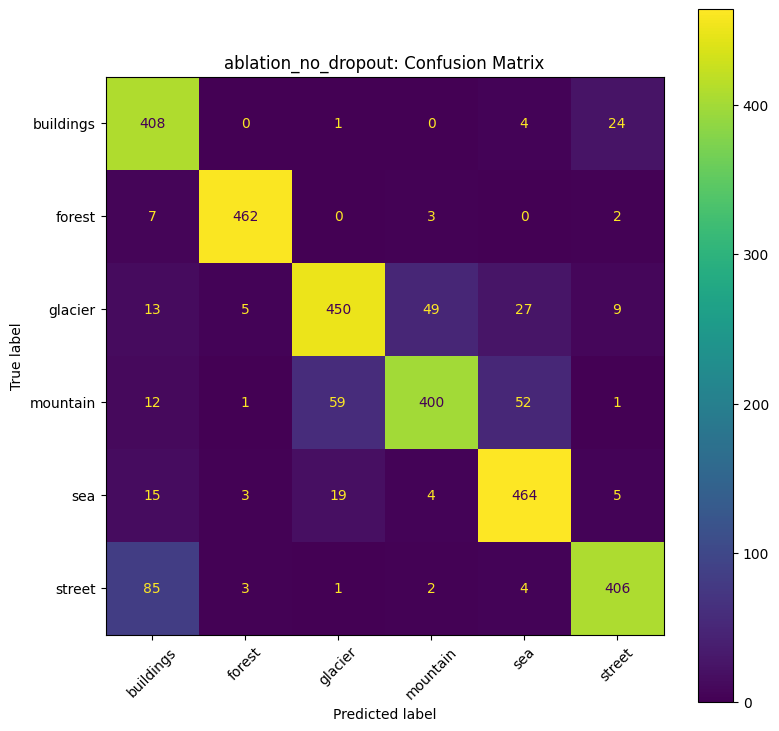

Saved model to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/ablation_no_dropout_final.keras


In [ ]:
ablation_checkpoint = OUTPUT_DIR / "ablation_no_dropout_best.keras"
ablation_final = OUTPUT_DIR / "ablation_no_dropout_final.keras"
ablation_history_path = OUTPUT_DIR / "ablation_no_dropout_history.csv"

if ablation_final.exists():
    print("Ablation final model already trained. Loading...")
    ablation_model = keras.models.load_model(ablation_final)

    if ablation_history_path.exists():
        ablation_history_df = pd.read_csv(ablation_history_path)
    else:
        ablation_history_df = None

    ablation_training_time = 0

elif ablation_checkpoint.exists():
    print("Ablation checkpoint found. Loading and continuing training...")
    ablation_model = keras.models.load_model(ablation_checkpoint)

    ablation_model, ablation_history_df, ablation_training_time = train_model(
        model=ablation_model,
        train_ds=train_ds_150,
        val_ds=val_ds_150,
        model_name="ablation_no_dropout",
        epochs=DEEPER_EPOCHS,
        optimizer_name="adam",
        learning_rate=0.001,
        patience=5
    )

else:
    print("Building ablation model from scratch...")
    ablation_model = build_deeper_cnn(
        use_batch_norm=True,
        use_dropout=False,  # key difference: dropout removed
        l2_value=0.001,
        model_name="Ablation_No_Dropout"
    )

    ablation_model, ablation_history_df, ablation_training_time = train_model(
        model=ablation_model,
        train_ds=train_ds_150,
        val_ds=val_ds_150,
        model_name="ablation_no_dropout",
        epochs=DEEPER_EPOCHS,
        optimizer_name="adam",
        learning_rate=0.001,
        patience=5
    )

ablation_model.summary()

ablation_metrics, ablation_report_df, ablation_cm = evaluate_model(
    ablation_model,
    test_ds_150,
    "ablation_no_dropout"
)

save_model(ablation_model, "ablation_no_dropout_final")
results = add_result(results, ablation_model, ablation_metrics, ablation_training_time)


,Model,Test Accuracy,Test Loss,Macro F1,Weighted F1,Training Time (minutes),Parameters
0,deeper_cnn_adam,0.836333,0.711210,0.836995,0.835173,22.224266,364902
1,ablation_no_dropout,0.863333,0.518128,0.864323,0.863001,19.636094,364902


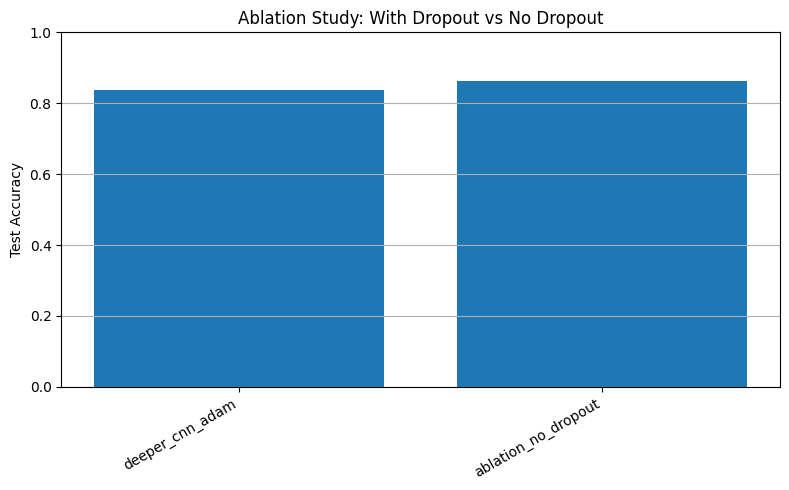

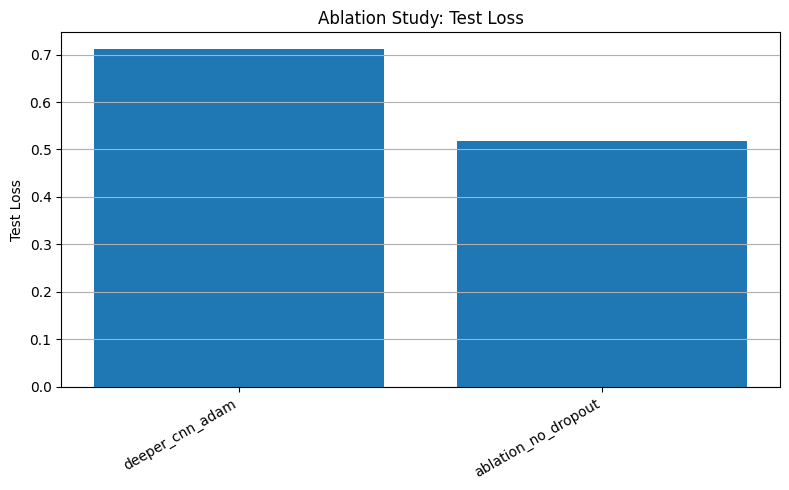

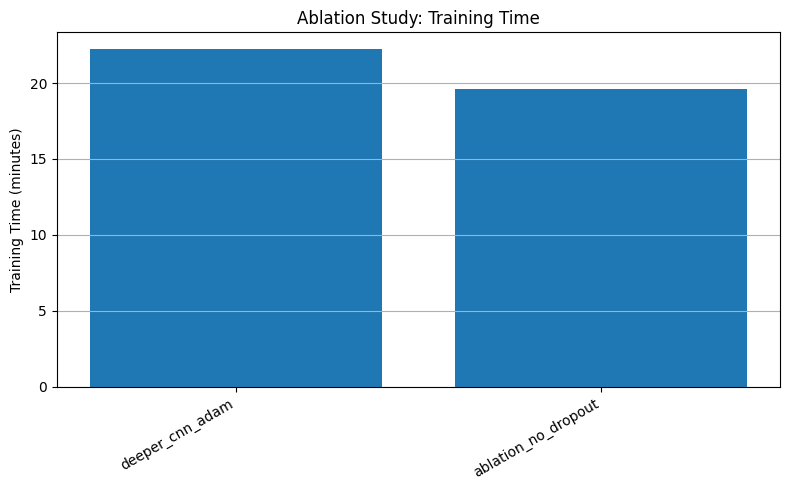

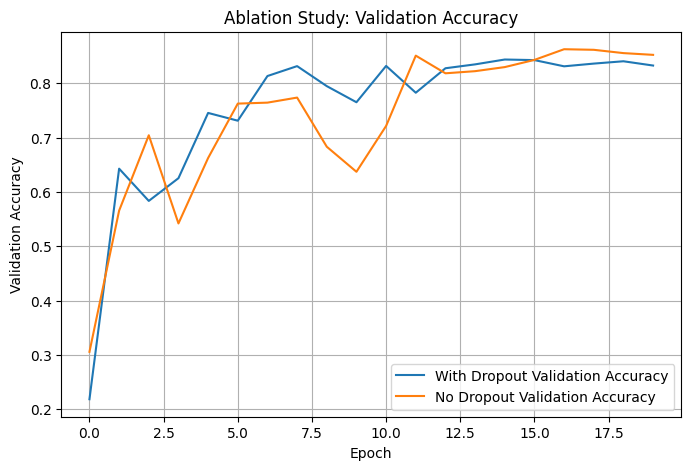

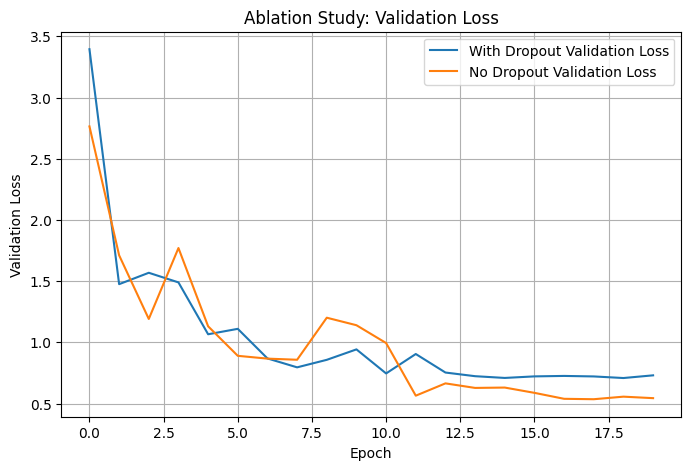

In [ ]:
ablation_comparison_df = pd.DataFrame([
    results[1],  # deeper_cnn_adam with dropout
    results[3]   # ablation without dropout
])

display(ablation_comparison_df)

plot_metric_comparison(ablation_comparison_df, "Test Accuracy", "Ablation Study: With Dropout vs No Dropout")
plot_metric_comparison(ablation_comparison_df, "Test Loss", "Ablation Study: Test Loss")
plot_metric_comparison(ablation_comparison_df, "Training Time (minutes)", "Ablation Study: Training Time")

plt.figure(figsize=(8, 5))
plt.plot(deeper_history_df["val_accuracy"], label="With Dropout Validation Accuracy")
plt.plot(ablation_history_df["val_accuracy"], label="No Dropout Validation Accuracy")
plt.title("Ablation Study: Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(deeper_history_df["val_loss"], label="With Dropout Validation Loss")
plt.plot(ablation_history_df["val_loss"], label="No Dropout Validation Loss")
plt.title("Ablation Study: Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

# Model Comparison

The table compares architecture changes, optimizer changes, ablation impact, F1-score, parameter count, and training time.

,Model,Test Accuracy,Test Loss,Macro F1,Weighted F1,Training Time (minutes),Parameters
0,ablation_no_dropout,0.863333,0.518128,0.864323,0.863001,19.636094,364902
1,baseline_cnn,0.845333,0.463029,0.846236,0.844813,13.148989,9604998
2,deeper_cnn_adam,0.836333,0.711210,0.836995,0.835173,22.224266,364902
3,deeper_cnn_sgd,0.591667,1.851140,0.551712,0.557315,11.633593,364902


Saved final comparison to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/day3_to_day5_model_comparison.csv


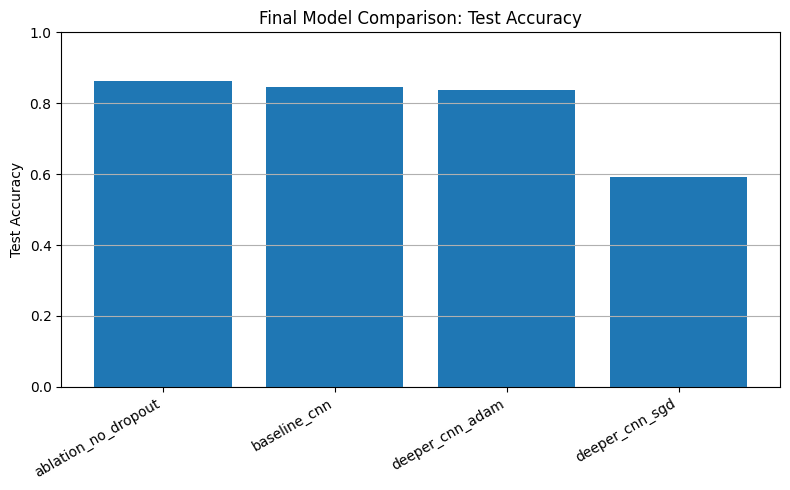

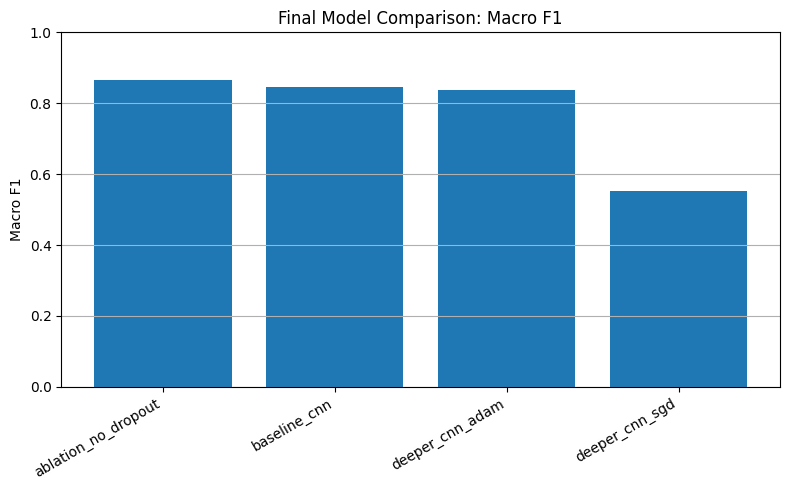

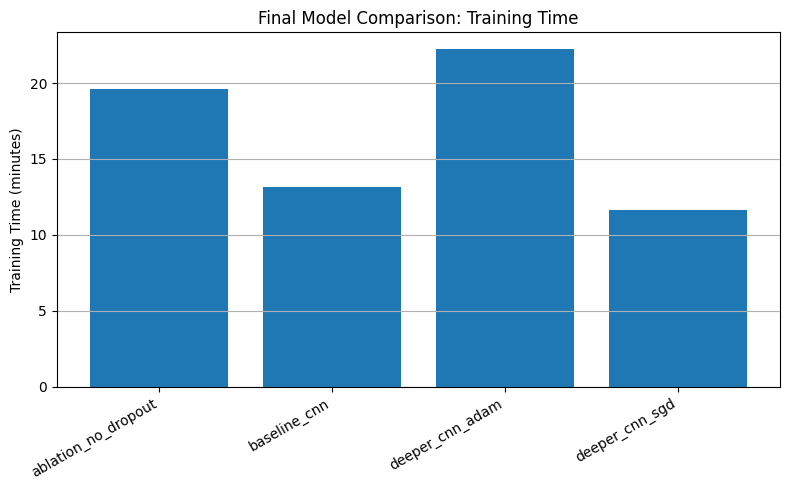

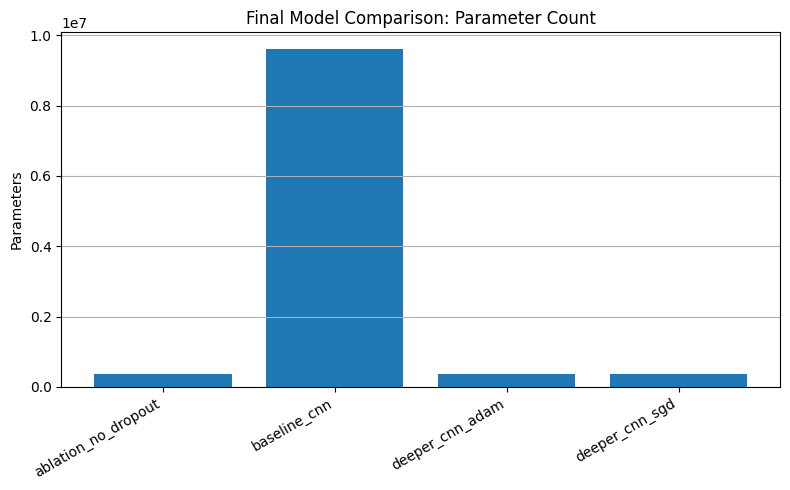

In [ ]:
final_comparison_df = pd.DataFrame(results)
final_comparison_df = final_comparison_df.sort_values(by="Test Accuracy", ascending=False).reset_index(drop=True)

display(final_comparison_df)

final_comparison_path = OUTPUT_DIR / "day3_to_day5_model_comparison.csv"
final_comparison_df.to_csv(final_comparison_path, index=False)

print("Saved final comparison to:", final_comparison_path)

plot_metric_comparison(final_comparison_df, "Test Accuracy", "Final Model Comparison: Test Accuracy")
plot_metric_comparison(final_comparison_df, "Macro F1", "Final Model Comparison: Macro F1")
plot_metric_comparison(final_comparison_df, "Training Time (minutes)", "Final Model Comparison: Training Time")
plot_metric_comparison(final_comparison_df, "Parameters", "Final Model Comparison: Parameter Count")

# Transfer Learning

Implements the 224×224 datasets already created earlier:

- train_ds_224
- val_ds_224
- test_ds_224

Transfer learning is completed in two stages:

1. **Feature extraction:** freeze the ImageNet convolutional base and train only the custom classification head.
2. **Fine-tuning:** unfreeze the final layers of the convolutional base and train using a very low learning rate.

In [ ]:
# Transfer Learning

from tensorflow.keras.applications import MobileNetV2, ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

required_day6_variables = [
    "train_ds_224", "val_ds_224", "test_ds_224",
    "CLASS_NAMES", "NUM_CLASSES", "OUTPUT_DIR",
    "results", "get_preprocessing_layers", "train_model",
    "evaluate_model", "plot_history", "plot_sample_predictions",
    "save_model", "add_result", "plot_metric_comparison"
]

missing_variables = [name for name in required_day6_variables if name not in globals()]

if missing_variables:
    raise NameError(
        "Run the earlier notebook cells before Day 6. Missing variables: " + ", ".join(missing_variables)
    )

print("Day 6 variables verified.")
print("Classes:", CLASS_NAMES)
print("Number of classes:", NUM_CLASSES)

for images, labels in train_ds_224.take(1):
    print("Transfer learning image batch:", images.shape)
    print("Transfer learning label batch:", labels.shape)
    print("Pixel range before application preprocessing:", float(tf.reduce_min(images)), "to", float(tf.reduce_max(images)))

Day 6 variables verified.
Classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Number of classes: 6
Transfer learning image batch: (32, 224, 224, 3)
Transfer learning label batch: (32, 6)
Pixel range before application preprocessing: 0.0 to 255.0


## Transfer-Learning Configuration


In [ ]:
# Transfer Learning Variables

TRANSFER_FEATURE_EPOCHS = 8
TRANSFER_FINE_TUNE_EPOCHS = 8
MOBILENET_FINE_TUNE_LAST_N = 40

# RUN_RESTNET50 variable determies whether to run ResNet50 or not.
# True to run the model

RUN_RESNET50 = True
RESNET50_FEATURE_EPOCHS = 6
RESNET50_FINE_TUNE_EPOCHS = 5
RESNET50_FINE_TUNE_LAST_N = 30

print("MobileNetV2 feature extraction epochs:", TRANSFER_FEATURE_EPOCHS)
print("MobileNetV2 fine-tuning epochs:", TRANSFER_FINE_TUNE_EPOCHS)
print("MobileNetV2 fine-tune last N layers:", MOBILENET_FINE_TUNE_LAST_N)
print("Run optional ResNet50:", RUN_RESNET50)

MobileNetV2 feature extraction epochs: 8
MobileNetV2 fine-tuning epochs: 8
MobileNetV2 fine-tune last N layers: 40
Run optional ResNet50: True


## Transfer-Learning Helper Functions



In [ ]:
# Transfer Learning Model

def upsert_result(results, model, metrics, training_time_seconds):
    """Add or replace a result row so rerunning a cell does not duplicate rows."""
    model_name = metrics["model"]
    results = [row for row in results if row["Model"] != model_name]
    return add_result(results, model, metrics, training_time_seconds)


def build_mobilenetv2_model(input_shape=(224, 224, 3), num_classes=NUM_CLASSES):
    augmentation_layer, _ = get_preprocessing_layers()

    raw_base_model = MobileNetV2(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )

    # Wrap the base model with a stable name so it can be retrieved for fine-tuning.
    base_model = keras.Model(
        inputs=raw_base_model.input,
        outputs=raw_base_model.output,
        name="MobileNetV2_base"
    )
    base_model.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = augmentation_layer(inputs)
    x = layers.Rescaling(1./127.5, offset=-1, name="mobilenetv2_preprocessing")(x)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
    x = layers.Dropout(0.30, name="classification_dropout_1")(x)
    x = layers.Dense(128, activation="relu", name="classification_dense_1")(x)
    x = layers.Dropout(0.20, name="classification_dropout_2")(x)
    outputs = layers.Dense(num_classes, activation="softmax", name="scene_classifier")(x)

    model = keras.Model(inputs, outputs, name="MobileNetV2_Transfer_Learning")
    return model, base_model


def build_resnet50_model(input_shape=(224, 224, 3), num_classes=NUM_CLASSES):
    augmentation_layer, _ = get_preprocessing_layers()

    raw_base_model = ResNet50(
        weights="imagenet",
        include_top=False,
        input_shape=input_shape
    )

    base_model = keras.Model(
        inputs=raw_base_model.input,
        outputs=raw_base_model.output,
        name="ResNet50_base"
    )
    base_model.trainable = False

    inputs = layers.Input(shape=input_shape)
    x = augmentation_layer(inputs)
    x = layers.Lambda(resnet50_preprocess_input, name="resnet50_preprocessing")(x)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
    x = layers.Dropout(0.35, name="classification_dropout_1")(x)
    x = layers.Dense(128, activation="relu", name="classification_dense_1")(x)
    x = layers.Dropout(0.25, name="classification_dropout_2")(x)
    outputs = layers.Dense(num_classes, activation="softmax", name="scene_classifier")(x)

    model = keras.Model(inputs, outputs, name="ResNet50_Transfer_Learning")
    return model, base_model


def prepare_for_fine_tuning(base_model, fine_tune_last_n=40):
    """Unfreeze only the last part of the convolutional base.

    Batch Normalization layers remain frozen for stable fine-tuning.
    """
    base_model.trainable = True

    if fine_tune_last_n is not None:
        for layer in base_model.layers[:-fine_tune_last_n]:
            layer.trainable = False

    for layer in base_model.layers:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False

    trainable_layers = sum(1 for layer in base_model.layers if layer.trainable)
    frozen_layers = sum(1 for layer in base_model.layers if not layer.trainable)

    print("Trainable base layers:", trainable_layers)
    print("Frozen base layers:", frozen_layers)

    return base_model


def plot_transfer_learning_history(feature_history_df, fine_tune_history_df, model_name):
    feature_epochs = len(feature_history_df)

    combined_accuracy = list(feature_history_df["accuracy"]) + list(fine_tune_history_df["accuracy"])
    combined_val_accuracy = list(feature_history_df["val_accuracy"]) + list(fine_tune_history_df["val_accuracy"])
    combined_loss = list(feature_history_df["loss"]) + list(fine_tune_history_df["loss"])
    combined_val_loss = list(feature_history_df["val_loss"]) + list(fine_tune_history_df["val_loss"])
    epochs = range(1, len(combined_accuracy) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, combined_accuracy, label="Training Accuracy")
    plt.plot(epochs, combined_val_accuracy, label="Validation Accuracy")
    plt.axvline(feature_epochs, linestyle="--", label="Fine-tuning starts")
    plt.title(f"{model_name}: Feature Extraction + Fine-Tuning Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, combined_loss, label="Training Loss")
    plt.plot(epochs, combined_val_loss, label="Validation Loss")
    plt.axvline(feature_epochs, linestyle="--", label="Fine-tuning starts")
    plt.title(f"{model_name}: Feature Extraction + Fine-Tuning Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()


## MobileNetV2

Only the new classification head is trained. The MobileNetV2 base remains frozen, which makes this stage fast and reduces the risk of overfitting.

In [ ]:
# Implementation of MobileNetV2

mobilenet_model, mobilenet_base = build_mobilenetv2_model()
mobilenet_model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "MobileNetV2_Transfer_Learning"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_preprocessing       │ (None, 224, 224, 3)    │             0 │
│ (Rescaling)                     │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV2_base (Functional)   │ (None, 7, 7, 1280)     │     2,257,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling          │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dropout_1        │ (None, 1280)           │             0 │
│ (Dropout)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dense_1 (Dense)  │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dropout_2        │ (None, 128)            │             0 │
│ (Dropout)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ scene_classifier (Dense)        │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,726 (9.24 MB)

 Trainable params: 164,742 (643.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Retrieving features if exists in drive

mobilenet_feature_final = OUTPUT_DIR / "mobilenetv2_feature_extraction_final.keras"
mobilenet_feature_checkpoint = OUTPUT_DIR / "mobilenetv2_feature_extraction_best.keras"

if mobilenet_feature_final.exists():
    print("Feature extraction already done. Loading from Drive...")
    mobilenet_model = keras.models.load_model(mobilenet_feature_final)
    mobilenet_feature_history_df = pd.read_csv(
        OUTPUT_DIR / "mobilenetv2_feature_extraction_history.csv"
    )
    mobilenet_feature_training_time = 0
    skip_feature_extraction = True

elif mobilenet_feature_checkpoint.exists():
    print("Checkpoint found. Resuming from best saved epoch...")
    mobilenet_model = keras.models.load_model(mobilenet_feature_checkpoint)
    skip_feature_extraction = False

else:
    print("No checkpoint found. Building MobileNetV2 from scratch...")
    mobilenet_model, mobilenet_base = build_mobilenetv2_model()
    skip_feature_extraction = False

mobilenet_model.summary()

No checkpoint found. Building MobileNetV2 from scratch...


Model: "MobileNetV2_Transfer_Learning"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_preprocessing       │ (None, 224, 224, 3)    │             0 │
│ (Rescaling)                     │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV2_base (Functional)   │ (None, 7, 7, 1280)     │     2,257,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling          │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dropout_1        │ (None, 1280)           │             0 │
│ (Dropout)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dense_1 (Dense)  │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dropout_2        │ (None, 128)            │             0 │
│ (Dropout)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ scene_classifier (Dense)        │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,726 (9.24 MB)

 Trainable params: 164,742 (643.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 69s 182ms/step - accuracy: 0.8292 - loss: 0.4692 - val_accuracy: 0.8971 - val_loss: 0.2727 - learning_rate: 0.0010
Epoch 2/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - accuracy: 0.8755 - loss: 0.3428 - val_accuracy: 0.9060 - val_loss: 0.2449 - learning_rate: 0.0010
Epoch 3/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - accuracy: 0.8831 - loss: 0.3143 - val_accuracy: 0.9039 - val_loss: 0.2509 - learning_rate: 0.0010
Epoch 4/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 50s 142ms/step - accuracy: 0.8863 - loss: 0.3024 - val_accuracy: 0.9035 - val_loss: 0.2608 - learning_rate: 0.0010
Epoch 5/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - accuracy: 0.9015 - loss: 0.2680 - val_accuracy: 0.9143 - val_loss: 0.2335 - learning_rate: 3.0000e-04
Epoch 6/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 81s 145ms/step - accuracy: 0.9023 - loss: 0.2651 - val_accuracy: 0.9121 - val_loss: 0.2312 - learning_rate: 3.0000e-04
Epoch 7/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - accuracy: 0.

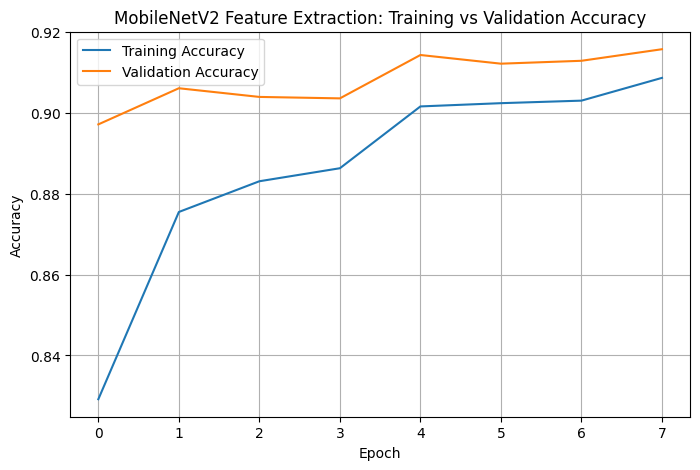

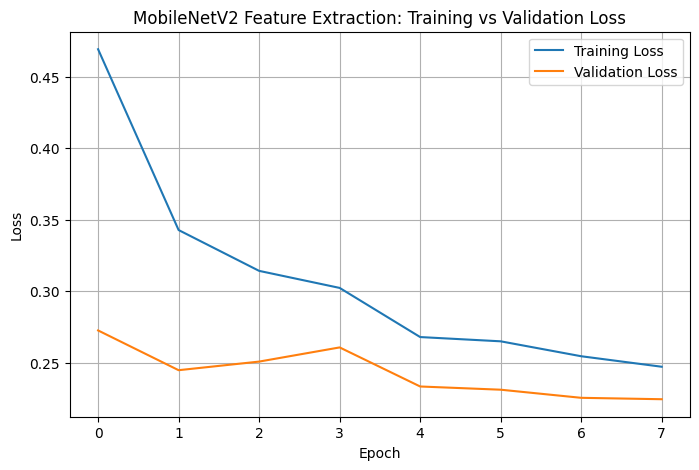

Feature extraction stage complete


In [ ]:
# Train MobileNetV2 Feature Extraction

# If feature extraction completed avoids the repeated feature extraction process

if not skip_feature_extraction:
    mobilenet_model, mobilenet_feature_history_df, mobilenet_feature_training_time = train_model(
        model=mobilenet_model,
        train_ds=train_ds_224,
        val_ds=val_ds_224,
        model_name="mobilenetv2_feature_extraction",
        epochs=TRANSFER_FEATURE_EPOCHS,
        optimizer_name="adam",
        learning_rate=0.001,
        patience=4
    )
    print("MobileNetV2 feature extraction training time minutes:",
          round(mobilenet_feature_training_time / 60, 2))

plot_history(mobilenet_feature_history_df, "MobileNetV2 Feature Extraction")
print("Feature extraction stage complete")

94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - accuracy: 0.9170 - loss: 0.2126

Classification Report:
              precision    recall  f1-score   support

   buildings       0.95      0.90      0.92       437
      forest       0.99      1.00      0.99       474
     glacier       0.87      0.83      0.85       553
    mountain       0.87      0.85      0.86       525
         sea       0.93      0.98      0.95       510
      street       0.91      0.95      0.93       501

    accuracy                           0.92      3000
   macro avg       0.92      0.92      0.92      3000
weighted avg       0.92      0.92      0.92      3000



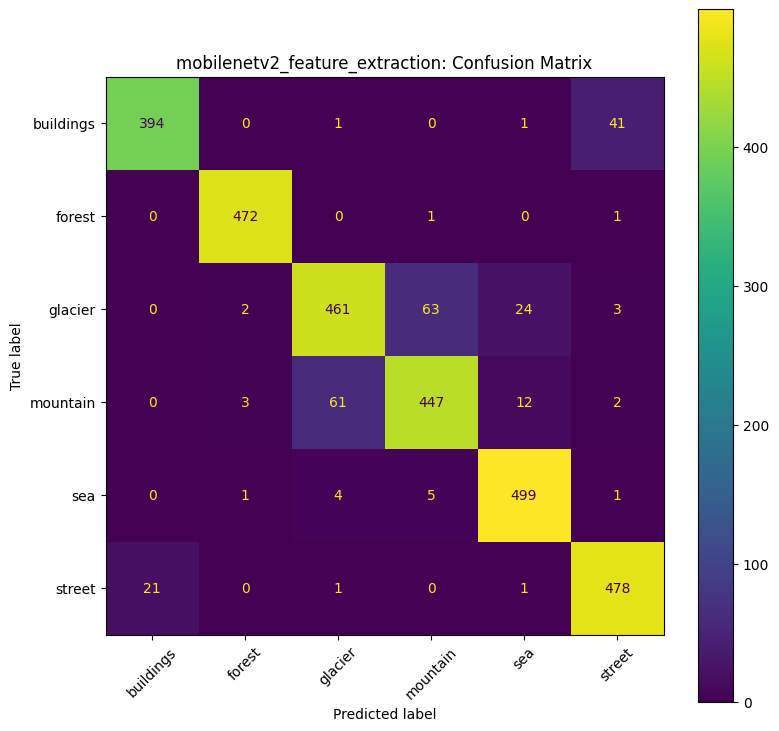

Saved model to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/mobilenetv2_feature_extraction_final.keras


In [ ]:
# Evaluation of MobileNetV2 model

mobilenet_feature_metrics, mobilenet_feature_report_df, mobilenet_feature_cm = evaluate_model(
    mobilenet_model,
    test_ds_224,
    "mobilenetv2_feature_extraction"
)

save_model(mobilenet_model, "mobilenetv2_feature_extraction_final")
results = upsert_result(results, mobilenet_model, mobilenet_feature_metrics, mobilenet_feature_training_time)

## MobileNetV2: Fine-Tuning

The final layers of MobileNetV2 are unfrozen and trained using a low learning rate. This adapts pretrained visual features to the scene classification task without overwriting useful ImageNet representations.

In [ ]:
# Prepare MobileNetV2 for fine-tuning

mobilenet_finetune_final = OUTPUT_DIR / "mobilenetv2_finetuned_final.keras"
mobilenet_finetune_checkpoint = OUTPUT_DIR / "mobilenetv2_finetuned_best.keras"

# Checking if fine tuning was done prior else fine tuning from the beginning
if mobilenet_finetune_final.exists():
    print("Fine tuning already done. Loading from Drive...")
    mobilenet_model = keras.models.load_model(mobilenet_finetune_final)
    mobilenet_finetune_history_df = pd.read_csv(
        OUTPUT_DIR / "mobilenetv2_finetuned_history.csv"
    )
    mobilenet_finetune_training_time = 0
    skip_fine_tuning = True

elif mobilenet_finetune_checkpoint.exists():
    print("Fine tune checkpoint found. Resuming...")
    mobilenet_model = keras.models.load_model(mobilenet_finetune_checkpoint)
    skip_fine_tuning = False

else:
    print("Preparing for fine tuning...")
    # REASON: mobilenet_base may not exist in memory after disconnect
    # so we retrieve it directly from inside the loaded model
    mobilenet_base = mobilenet_model.get_layer("MobileNetV2_base")
    mobilenet_base = prepare_for_fine_tuning(
        mobilenet_base,
        fine_tune_last_n=MOBILENET_FINE_TUNE_LAST_N
    )
    skip_fine_tuning = False

mobilenet_model.summary()

Preparing for fine tuning...
Trainable base layers: 26
Frozen base layers: 128


Model: "MobileNetV2_Transfer_Learning"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_preprocessing       │ (None, 224, 224, 3)    │             0 │
│ (Rescaling)                     │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV2_base (Functional)   │ (None, 7, 7, 1280)     │     2,257,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling          │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dropout_1        │ (None, 1280)           │             0 │
│ (Dropout)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dense_1 (Dense)  │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dropout_2        │ (None, 128)            │             0 │
│ (Dropout)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ scene_classifier (Dense)        │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,752,212 (10.50 MB)

 Trainable params: 1,828,102 (6.97 MB)

 Non-trainable params: 594,624 (2.27 MB)

 Optimizer params: 329,486 (1.26 MB)

Epoch 1/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 77s 167ms/step - accuracy: 0.9071 - loss: 0.2523 - val_accuracy: 0.9182 - val_loss: 0.2232 - learning_rate: 1.0000e-05
Epoch 2/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - accuracy: 0.9156 - loss: 0.2289 - val_accuracy: 0.9114 - val_loss: 0.2297 - learning_rate: 1.0000e-05
Epoch 3/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 80s 151ms/step - accuracy: 0.9203 - loss: 0.2181 - val_accuracy: 0.9157 - val_loss: 0.2293 - learning_rate: 1.0000e-05
Epoch 4/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - accuracy: 0.9270 - loss: 0.1968 - val_accuracy: 0.9210 - val_loss: 0.2139 - learning_rate: 3.0000e-06
Epoch 5/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.9307 - loss: 0.1906 - val_accuracy: 0.9193 - val_loss: 0.2154 - learning_rate: 3.0000e-06
Epoch 6/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - accuracy: 0.9317 - loss: 0.1901 - val_accuracy: 0.9196 - val_loss: 0.2152 - learning_rate: 3.0000e-06
Epoch 7/8
350/350 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/ste

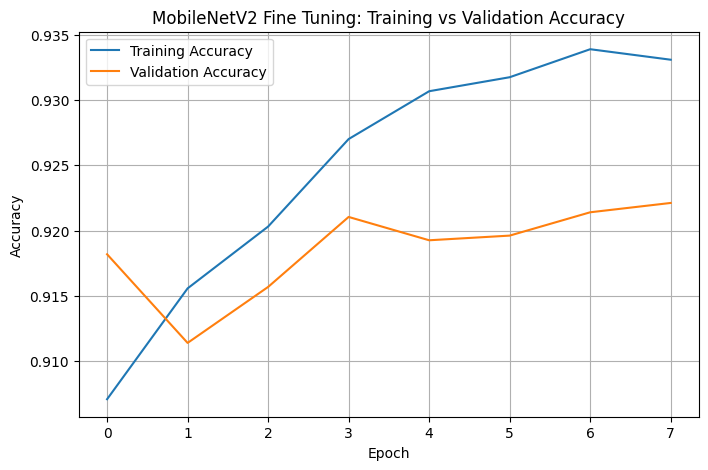

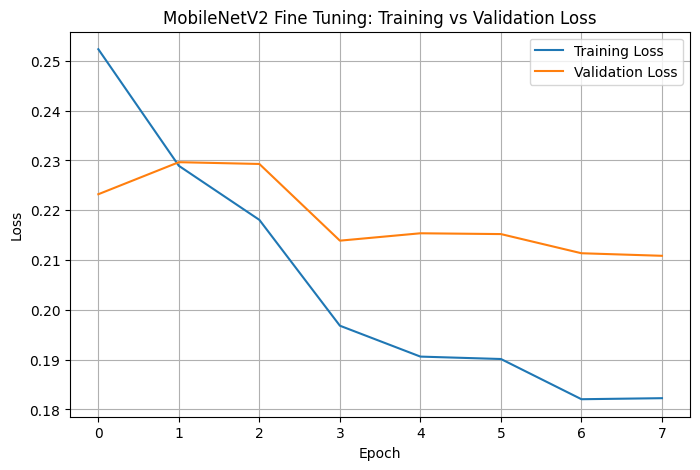

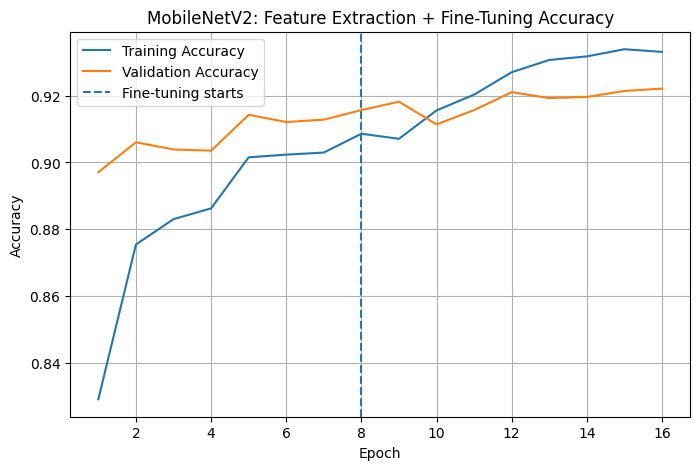

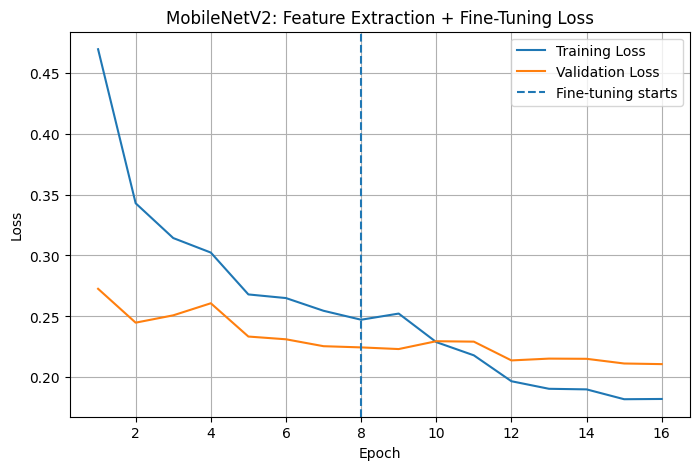

Fine tuning complete


In [ ]:
# Training Fine-tuned MobileNetV2

if not skip_fine_tuning:
    mobilenet_model, mobilenet_finetune_history_df, mobilenet_finetune_training_time = train_model(
        model=mobilenet_model,
        train_ds=train_ds_224,
        val_ds=val_ds_224,
        model_name="mobilenetv2_finetuned",
        epochs=TRANSFER_FINE_TUNE_EPOCHS,
        optimizer_name="adam",
        learning_rate=1e-5,
        patience=4
    )
    print("Fine tuning time minutes:",
          round(mobilenet_finetune_training_time / 60, 2))

mobilenet_total_training_time = (
    mobilenet_feature_training_time + mobilenet_finetune_training_time
)
print("Total MobileNetV2 time minutes:",
      round(mobilenet_total_training_time / 60, 2))

plot_history(mobilenet_finetune_history_df, "MobileNetV2 Fine Tuning")
plot_transfer_learning_history(
    mobilenet_feature_history_df,
    mobilenet_finetune_history_df,
    "MobileNetV2"
)
print("Fine tuning complete")

94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - accuracy: 0.9303 - loss: 0.1841

Classification Report:
              precision    recall  f1-score   support

   buildings       0.94      0.93      0.94       437
      forest       0.99      0.99      0.99       474
     glacier       0.87      0.88      0.88       553
    mountain       0.90      0.86      0.88       525
         sea       0.95      0.98      0.97       510
      street       0.94      0.95      0.94       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93      0.93      0.93      3000



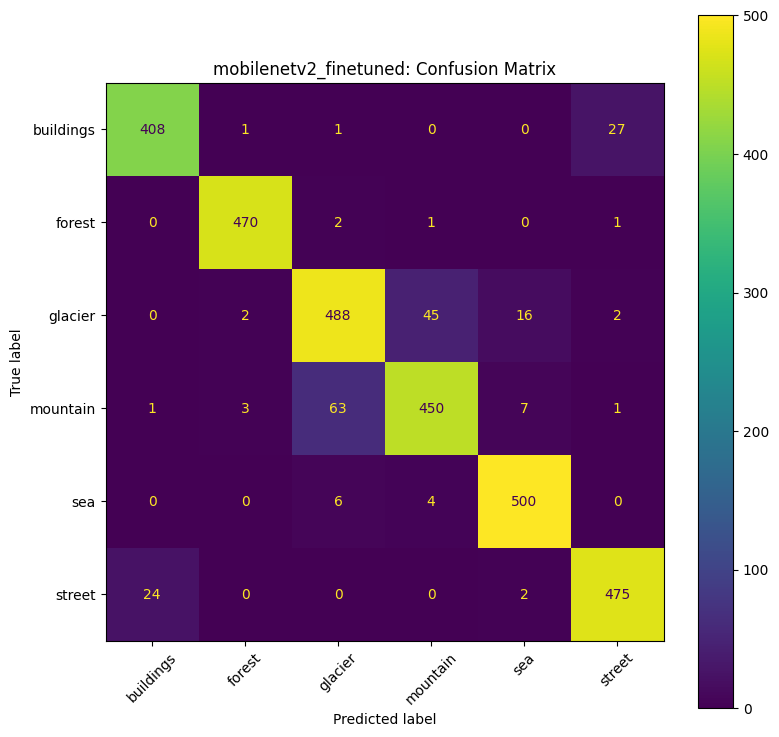

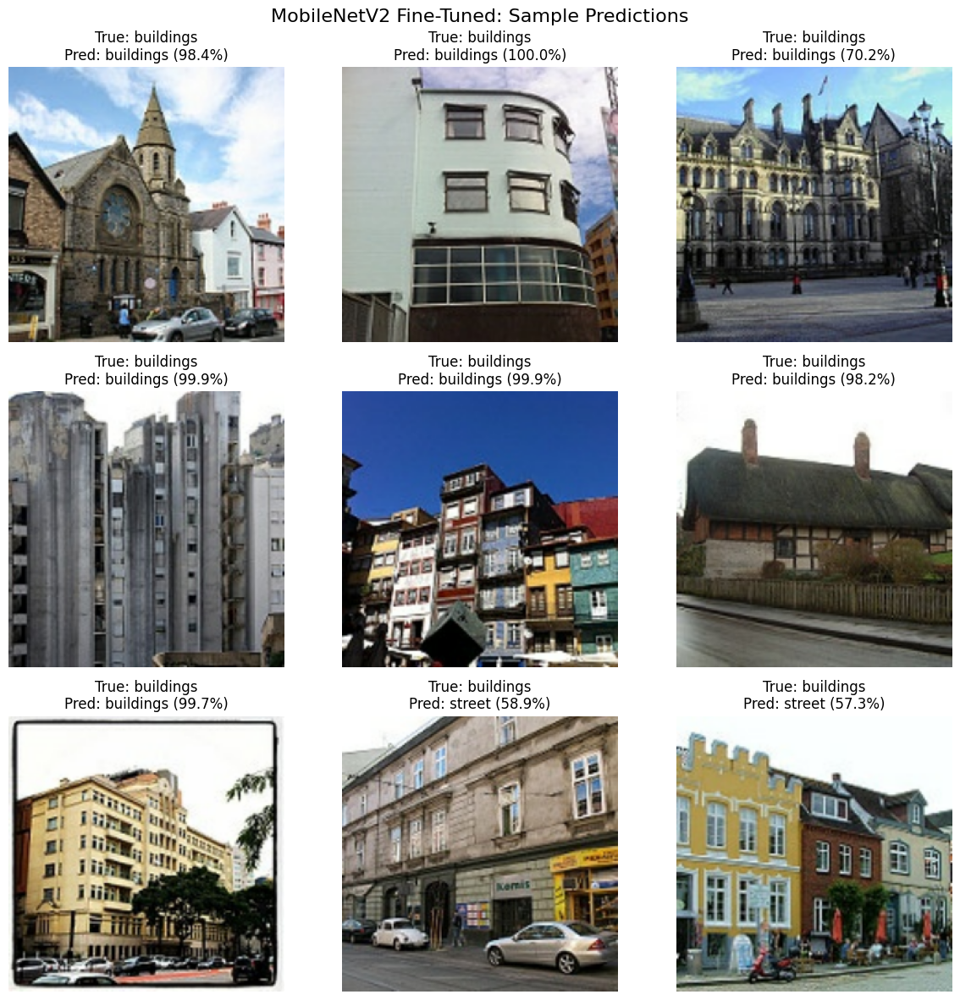

Saved model to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/mobilenetv2_finetuned_final.keras


In [ ]:
# Evaluate MobileNetV2 after fine-tuning

mobilenet_finetune_metrics, mobilenet_finetune_report_df, mobilenet_finetune_cm = evaluate_model(
    mobilenet_model,
    test_ds_224,
    "mobilenetv2_finetuned"
)

plot_sample_predictions(mobilenet_model, test_ds_224, "MobileNetV2 Fine-Tuned")
save_model(mobilenet_model, "mobilenetv2_finetuned_final")

# Use total time because the fine-tuned model depends on both training stages.
results = upsert_result(results, mobilenet_model, mobilenet_finetune_metrics, mobilenet_total_training_time)

## Optional: ResNet50 Transfer Learning

RUN_RESNET50 is used in order to avoid running the ResNet50. The variable must be turned true to train the model

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "ResNet50_Transfer_Learning"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50_preprocessing (Lambda) │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ ResNet50_base (Functional)      │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling          │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dropout_1        │ (None, 2048)           │             0 │
│ (Dropout)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dense_1 (Dense)  │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_dropout_2        │ (None, 128)            │             0 │
│ (Dropout)                       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ scene_classifier (Dense)        │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,850,758 (90.98 MB)

 Trainable params: 263,046 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 78s 198ms/step - accuracy: 0.8587 - loss: 0.3949 - val_accuracy: 0.9210 - val_loss: 0.2198 - learning_rate: 0.0010
Epoch 2/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 66s 189ms/step - accuracy: 0.8953 - loss: 0.2855 - val_accuracy: 0.9275 - val_loss: 0.2064 - learning_rate: 0.0010
Epoch 3/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 67s 190ms/step - accuracy: 0.9054 - loss: 0.2544 - val_accuracy: 0.9296 - val_loss: 0.1948 - learning_rate: 0.0010
Epoch 4/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 66s 189ms/step - accuracy: 0.9091 - loss: 0.2396 - val_accuracy: 0.9396 - val_loss: 0.1920 - learning_rate: 0.0010
Epoch 5/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 66s 186ms/step - accuracy: 0.9161 - loss: 0.2303 - val_accuracy: 0.9318 - val_loss: 0.2029 - learning_rate: 0.0010
Epoch 6/6
350/350 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.9154 - loss: 0.2254 - val_accuracy: 0.9289 - val_loss: 0.1989 - learning_rate: 0.0010


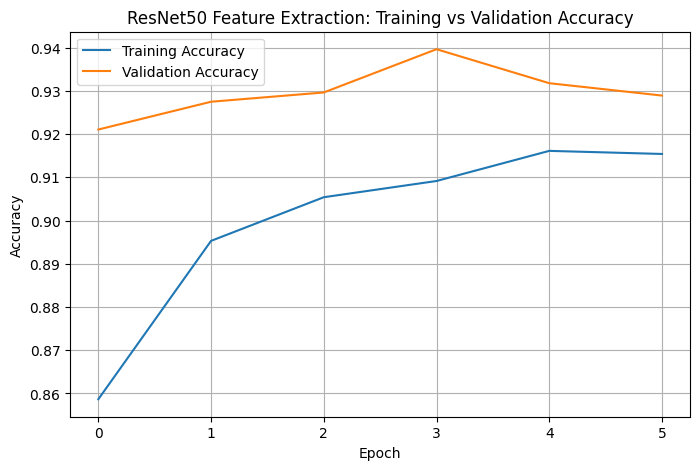

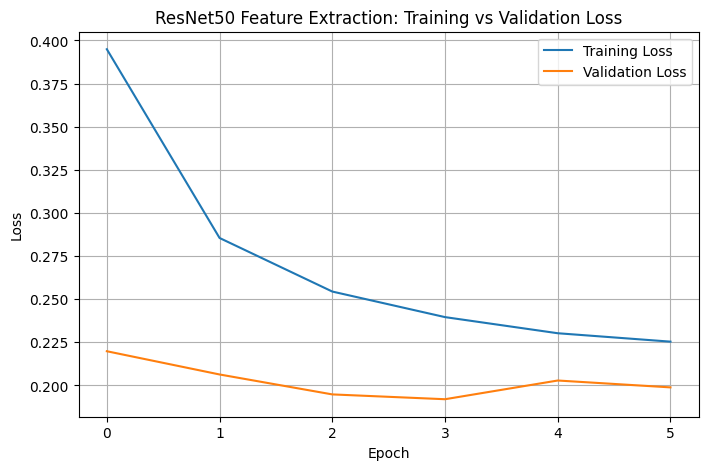

94/94 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - accuracy: 0.9260 - loss: 0.1940

Classification Report:
              precision    recall  f1-score   support

   buildings       0.95      0.92      0.93       437
      forest       0.99      1.00      0.99       474
     glacier       0.88      0.85      0.87       553
    mountain       0.87      0.86      0.87       525
         sea       0.95      0.99      0.97       510
      street       0.93      0.95      0.94       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93      0.93      0.93      3000



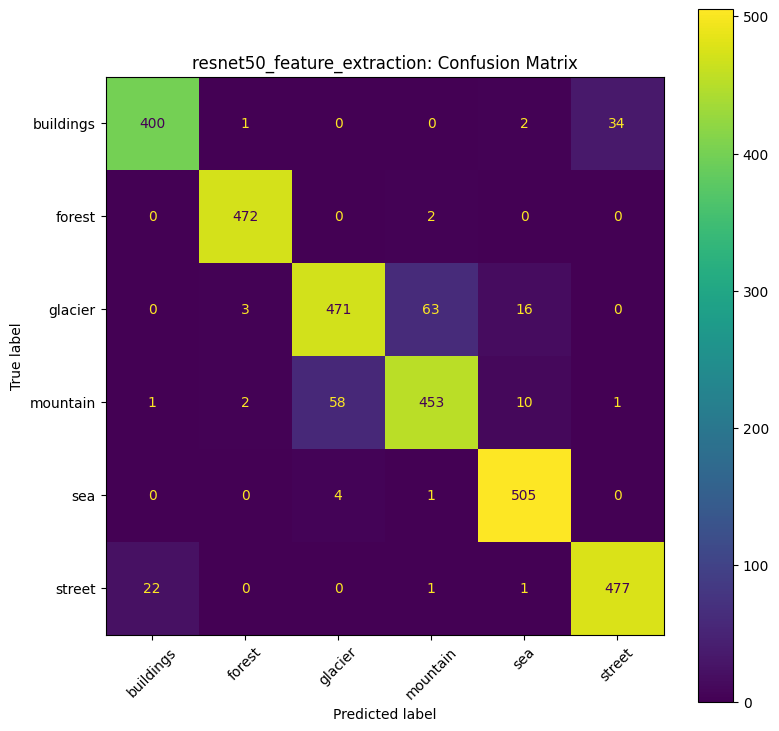

Saved model to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/resnet50_feature_extraction_final.keras
Trainable base layers: 21
Frozen base layers: 154
Epoch 1/5
350/350 ━━━━━━━━━━━━━━━━━━━━ 95s 238ms/step - accuracy: 0.9208 - loss: 0.2125 - val_accuracy: 0.9393 - val_loss: 0.1844 - learning_rate: 1.0000e-05
Epoch 2/5
350/350 ━━━━━━━━━━━━━━━━━━━━ 78s 224ms/step - accuracy: 0.9315 - loss: 0.1844 - val_accuracy: 0.9239 - val_loss: 0.2017 - learning_rate: 1.0000e-05
Epoch 3/5
350/350 ━━━━━━━━━━━━━━━━━━━━ 80s 229ms/step - accuracy: 0.9351 - loss: 0.1685 - val_accuracy: 0.9357 - val_loss: 0.1820 - learning_rate: 1.0000e-05
Epoch 4/5
350/350 ━━━━━━━━━━━━━━━━━━━━ 83s 233ms/step - accuracy: 0.9454 - loss: 0.1441 - val_accuracy: 0.9350 - val_loss: 0.1898 - learning_rate: 1.0000e-05
Epoch 5/5
350/350 ━━━━━━━━━━━━━━━━━━━━ 78s 222ms/step - accuracy: 0.9486 - loss: 0.1399 - val_accuracy: 0.9382 - val_loss: 0.1966 - learning_rate: 1.0000e-05


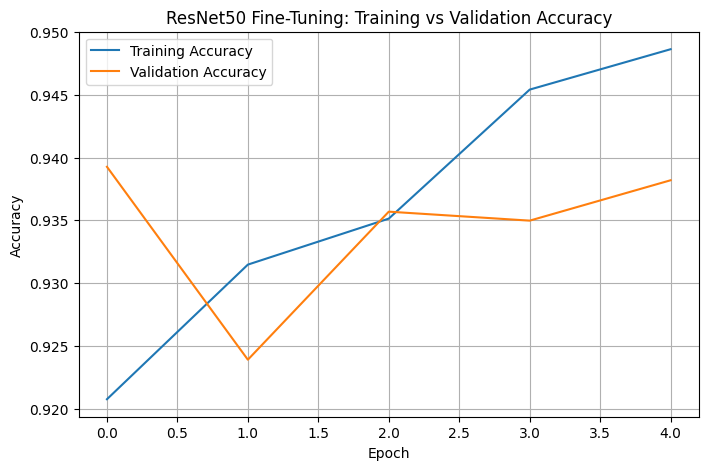

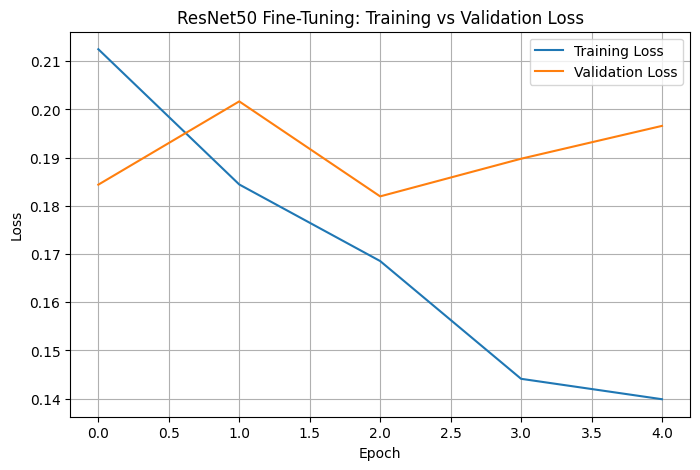

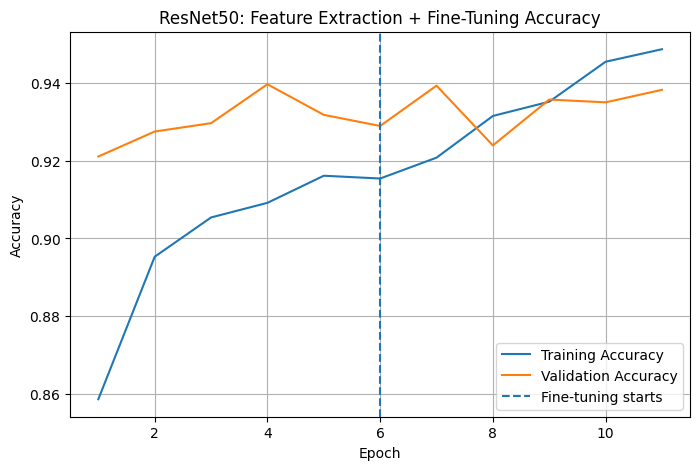

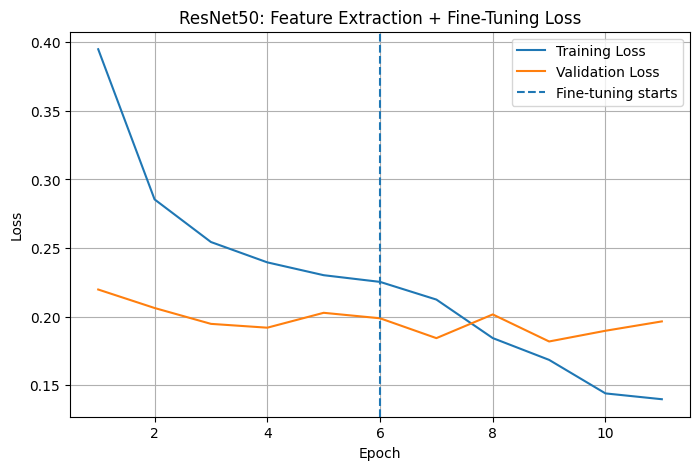

94/94 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - accuracy: 0.9353 - loss: 0.1721

Classification Report:
              precision    recall  f1-score   support

   buildings       0.95      0.92      0.94       437
      forest       1.00      0.99      0.99       474
     glacier       0.89      0.88      0.88       553
    mountain       0.89      0.88      0.89       525
         sea       0.97      0.99      0.98       510
      street       0.93      0.95      0.94       501

    accuracy                           0.94      3000
   macro avg       0.94      0.94      0.94      3000
weighted avg       0.94      0.94      0.94      3000



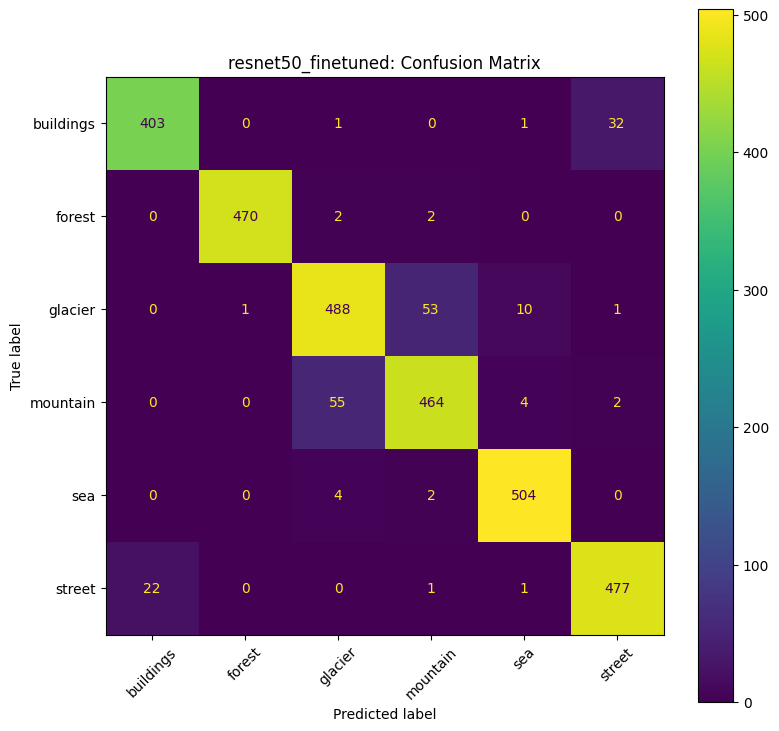

Saved model to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/resnet50_finetuned_final.keras


In [ ]:
# ============================================================
# OPTIONAL RESNET50 TRANSFER LEARNING
# ============================================================

if RUN_RESNET50:
    resnet_model, resnet_base = build_resnet50_model()
    resnet_model.summary()

    resnet_model, resnet_feature_history_df, resnet_feature_training_time = train_model(
        model=resnet_model,
        train_ds=train_ds_224,
        val_ds=val_ds_224,
        model_name="resnet50_feature_extraction",
        epochs=RESNET50_FEATURE_EPOCHS,
        optimizer_name="adam",
        learning_rate=0.001,
        patience=3
    )

    plot_history(resnet_feature_history_df, "ResNet50 Feature Extraction")

    resnet_feature_metrics, resnet_feature_report_df, resnet_feature_cm = evaluate_model(
        resnet_model,
        test_ds_224,
        "resnet50_feature_extraction"
    )

    save_model(resnet_model, "resnet50_feature_extraction_final")
    results = upsert_result(results, resnet_model, resnet_feature_metrics, resnet_feature_training_time)

    resnet_base = prepare_for_fine_tuning(
        resnet_base,
        fine_tune_last_n=RESNET50_FINE_TUNE_LAST_N
    )

    resnet_model, resnet_finetune_history_df, resnet_finetune_training_time = train_model(
        model=resnet_model,
        train_ds=train_ds_224,
        val_ds=val_ds_224,
        model_name="resnet50_finetuned",
        epochs=RESNET50_FINE_TUNE_EPOCHS,
        optimizer_name="adam",
        learning_rate=1e-5,
        patience=3
    )

    resnet_total_training_time = resnet_feature_training_time + resnet_finetune_training_time

    plot_history(resnet_finetune_history_df, "ResNet50 Fine-Tuning")
    plot_transfer_learning_history(
        resnet_feature_history_df,
        resnet_finetune_history_df,
        "ResNet50"
    )

    resnet_finetune_metrics, resnet_finetune_report_df, resnet_finetune_cm = evaluate_model(
        resnet_model,
        test_ds_224,
        "resnet50_finetuned"
    )

    save_model(resnet_model, "resnet50_finetuned_final")
    results = upsert_result(results, resnet_model, resnet_finetune_metrics, resnet_total_training_time)

else:
    print("ResNet50 skipped to reduce runtime. Set RUN_RESNET50 = True if GPU time allows.")

## Day 6 Transfer-Learning Comparison

This table adds transfer-learning models to the scratch CNN experiments from Days 3–5.

,Model,Test Accuracy,Test Loss,Macro F1,Weighted F1,Training Time (minutes),Parameters
0,resnet50_finetuned,0.935333,0.172122,0.936891,0.935229,13.720358,23850758
1,mobilenetv2_finetuned,0.930333,0.184093,0.931990,0.930063,15.822207,2422726
2,resnet50_feature_extraction,0.926000,0.194039,0.927568,0.925527,6.809498,23850758
3,mobilenetv2_feature_extraction,0.917000,0.212624,0.918708,0.916404,7.598185,2422726
4,ablation_no_dropout,0.863333,0.518128,0.864323,0.863001,19.636094,364902
5,baseline_cnn,0.845333,0.463029,0.846236,0.844813,13.148989,9604998
6,deeper_cnn_adam,0.836333,0.711210,0.836995,0.835173,22.224266,364902
7,deeper_cnn_sgd,0.591667,1.851140,0.551712,0.557315,11.633593,364902


Saved Day 6 comparison to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/day6_transfer_learning_comparison.csv


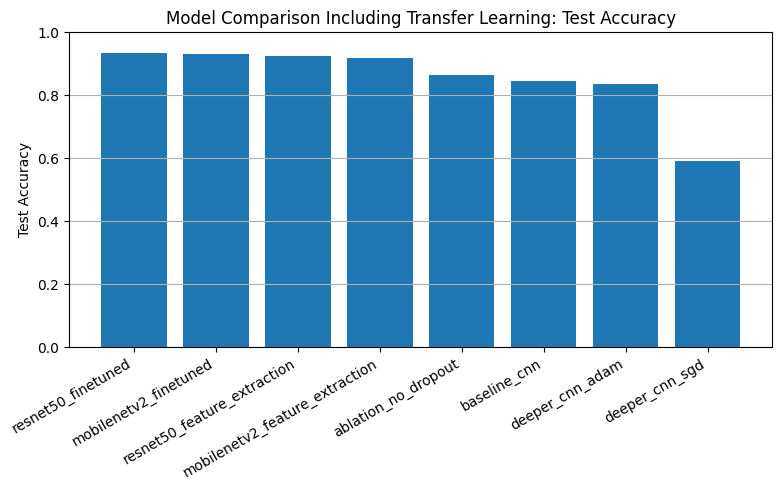

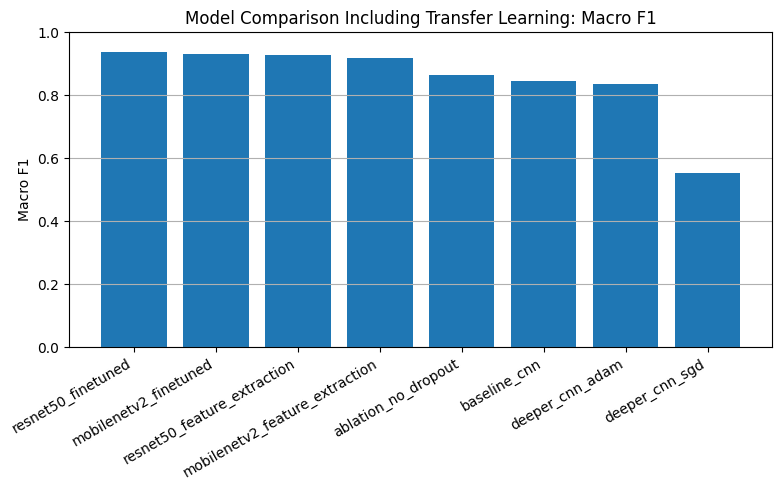

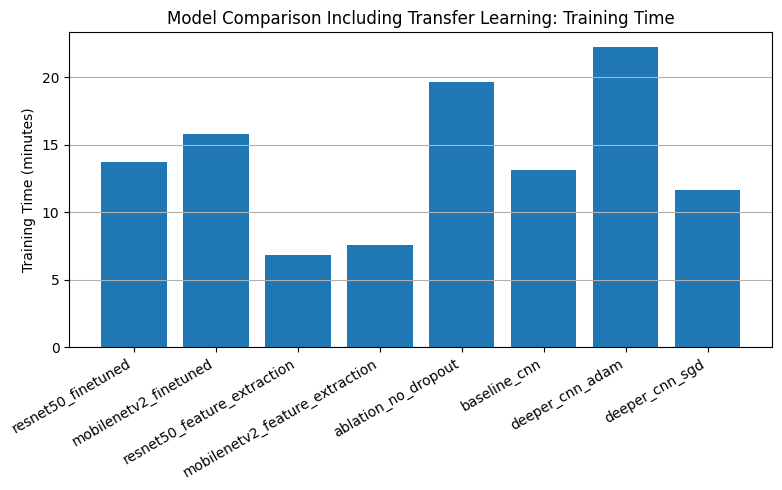

In [ ]:
# ============================================================
# DAY 6 MODEL COMPARISON
# ============================================================

day6_comparison_df = pd.DataFrame(results)
day6_comparison_df = day6_comparison_df.drop_duplicates(subset=["Model"], keep="last")
day6_comparison_df = day6_comparison_df.sort_values(by="Test Accuracy", ascending=False).reset_index(drop=True)

display(day6_comparison_df)

day6_comparison_path = OUTPUT_DIR / "day6_transfer_learning_comparison.csv"
day6_comparison_df.to_csv(day6_comparison_path, index=False)

print("Saved Day 6 comparison to:", day6_comparison_path)

plot_metric_comparison(day6_comparison_df, "Test Accuracy", "Model Comparison Including Transfer Learning: Test Accuracy")
plot_metric_comparison(day6_comparison_df, "Macro F1", "Model Comparison Including Transfer Learning: Macro F1")
plot_metric_comparison(day6_comparison_df, "Training Time (minutes)", "Model Comparison Including Transfer Learning: Training Time")

# Final Results and Error Analysis



In [ ]:
# Comparison Table

final_all_models_df = pd.DataFrame(results)
final_all_models_df = final_all_models_df.drop_duplicates(subset=["Model"], keep="last")
final_all_models_df = final_all_models_df.sort_values(by="Test Accuracy", ascending=False).reset_index(drop=True)

final_all_models_display_df = final_all_models_df.copy()
for column in ["Test Accuracy", "Test Loss", "Macro F1", "Weighted F1", "Training Time (minutes)"]:
    final_all_models_display_df[column] = final_all_models_display_df[column].round(4)

final_all_models_display_df["Parameters"] = final_all_models_display_df["Parameters"].astype(int)

display(final_all_models_display_df)

final_all_models_path = OUTPUT_DIR / "final_all_models_comparison_day2_to_day7.csv"
final_all_models_display_df.to_csv(final_all_models_path, index=False)

print("Saved final all-model comparison to:", final_all_models_path)

,Model,Test Accuracy,Test Loss,Macro F1,Weighted F1,Training Time (minutes),Parameters
0,resnet50_finetuned,0.9353,0.1721,0.9369,0.9352,13.7204,23850758
1,mobilenetv2_finetuned,0.9303,0.1841,0.9320,0.9301,15.8222,2422726
2,resnet50_feature_extraction,0.9260,0.1940,0.9276,0.9255,6.8095,23850758
3,mobilenetv2_feature_extraction,0.9170,0.2126,0.9187,0.9164,7.5982,2422726
4,ablation_no_dropout,0.8633,0.5181,0.8643,0.8630,19.6361,364902
5,baseline_cnn,0.8453,0.4630,0.8462,0.8448,13.1490,9604998
6,deeper_cnn_adam,0.8363,0.7112,0.8370,0.8352,22.2243,364902
7,deeper_cnn_sgd,0.5917,1.8511,0.5517,0.5573,11.6336,364902


Saved final all-model comparison to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/final_all_models_comparison_day2_to_day7.csv


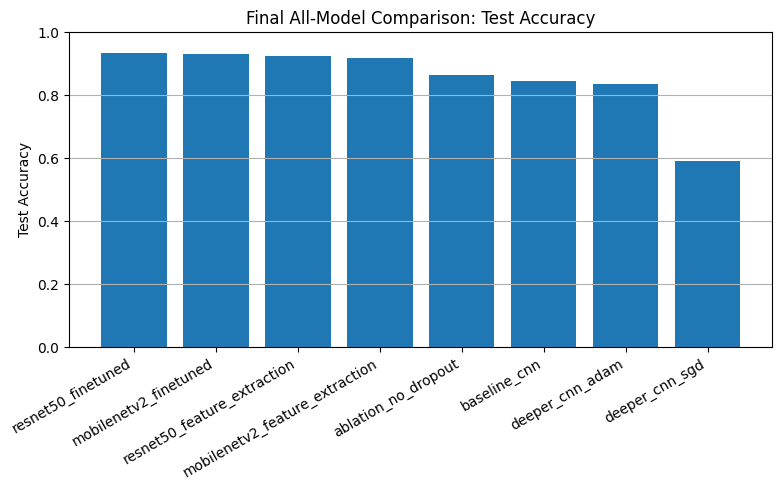

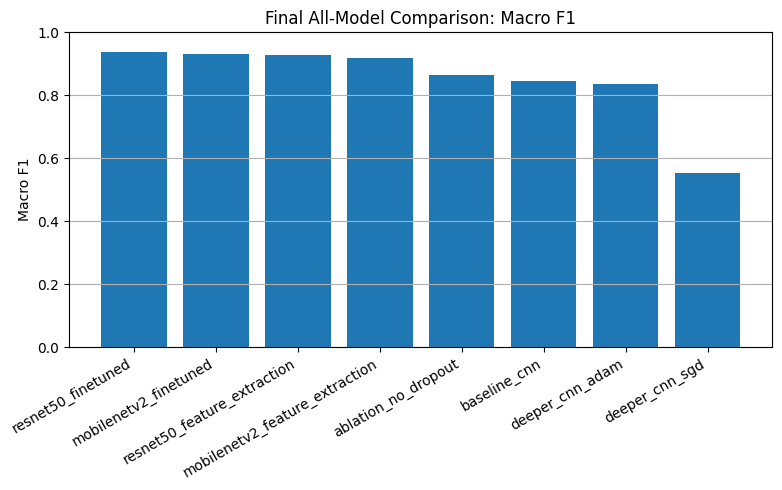

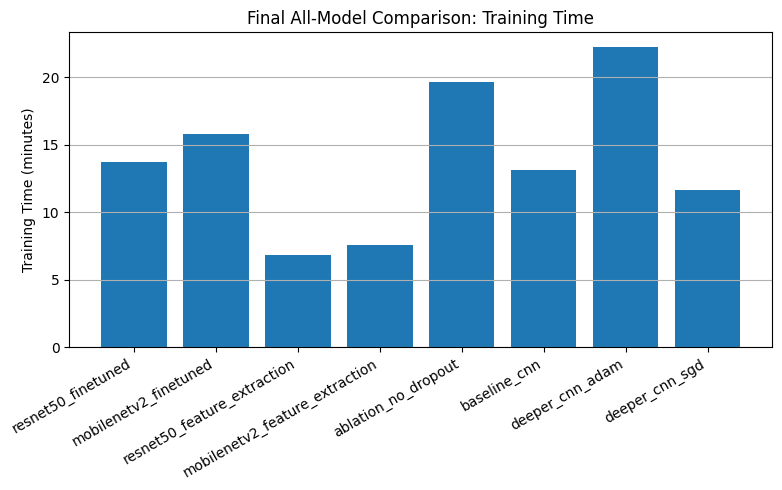

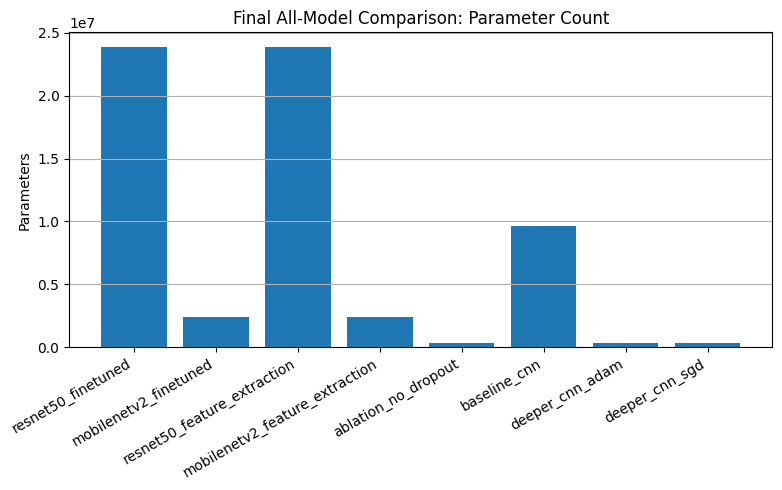

In [ ]:
# Visualization of the comparison of the models

plot_metric_comparison(final_all_models_df, "Test Accuracy", "Final All-Model Comparison: Test Accuracy")
plot_metric_comparison(final_all_models_df, "Macro F1", "Final All-Model Comparison: Macro F1")
plot_metric_comparison(final_all_models_df, "Training Time (minutes)", "Final All-Model Comparison: Training Time")
plot_metric_comparison(final_all_models_df, "Parameters", "Final All-Model Comparison: Parameter Count")

## Best Model Selection

The final model is selected primarily by test accuracyand macro F1-score

In [ ]:
# Best Model Identification

best_model_row = final_all_models_df.iloc[0]
best_model_name = best_model_row["Model"]

print("Best model based on test accuracy:")
print("Model:", best_model_name)
print("Test accuracy:", round(best_model_row["Test Accuracy"], 4))
print("Macro F1:", round(best_model_row["Macro F1"], 4))
print("Weighted F1:", round(best_model_row["Weighted F1"], 4))
print("Training time minutes:", round(best_model_row["Training Time (minutes)"], 2))
print("Parameter count:", int(best_model_row["Parameters"]))

trained_models = {}
if "baseline_model" in globals():
    trained_models["baseline_cnn"] = baseline_model
if "deeper_model" in globals():
    trained_models["deeper_cnn_adam"] = deeper_model
if "sgd_model" in globals():
    trained_models["deeper_cnn_sgd"] = sgd_model
if "ablation_model" in globals():
    trained_models["ablation_no_dropout"] = ablation_model
if "mobilenet_model" in globals():
    trained_models["mobilenetv2_finetuned"] = mobilenet_model
if "resnet_model" in globals():
    trained_models["resnet50_finetuned"] = resnet_model
    trained_models["resnet50_feature_extraction"] = resnet_model


def load_saved_model_if_available(model_name):
    model_path = OUTPUT_DIR / f"{model_name}_final.keras"

    if not model_path.exists():
        return None

    try:
        return keras.models.load_model(model_path)
    except TypeError:
        return keras.models.load_model(model_path, safe_mode=False)
    except Exception as error:
        print(f"Could not load saved model for {model_name}: {error}")
        return None

best_model = trained_models.get(best_model_name)

# The MobileNetV2 feature-extraction model is saved before fine-tuning.
# If it is the best row, load the saved feature-extraction model.
if best_model_name == "mobilenetv2_feature_extraction":
    best_model = load_saved_model_if_available("mobilenetv2_feature_extraction")

if best_model is None:
    best_model = load_saved_model_if_available(best_model_name)

if best_model is None:
    print("Best model object was not found. Re-run the corresponding training cell before error analysis.")
else:
    print("Best model ready for error analysis:", best_model.name)

Best model based on test accuracy:
Model: resnet50_finetuned
Test accuracy: 0.9353
Macro F1: 0.9369
Weighted F1: 0.9352
Training time minutes: 13.72
Parameter count: 23850758
Best model ready for error analysis: ResNet50_Transfer_Learning


## Error Analysis

This section displays high-confidence incorrect predictions. These examples help explain model limitations, especially between visually similar classes such as glacier, mountain, sea, buildings, and street.

In [ ]:
# Error analysis helpers

def prediction_details(model, dataset, paths, model_name):
    true_labels = []
    predicted_labels = []
    confidences = []

    for images, labels in dataset:
        probabilities = model.predict(images, verbose=0)
        true_batch = np.argmax(labels.numpy(), axis=1)
        pred_batch = np.argmax(probabilities, axis=1)
        confidence_batch = np.max(probabilities, axis=1)

        true_labels.extend(true_batch)
        predicted_labels.extend(pred_batch)
        confidences.extend(confidence_batch)

    details_df = pd.DataFrame({
        "path": paths[:len(true_labels)],
        "true_index": true_labels,
        "predicted_index": predicted_labels,
        "confidence": confidences
    })

    details_df["true_class"] = details_df["true_index"].map(index_to_class)
    details_df["predicted_class"] = details_df["predicted_index"].map(index_to_class)
    details_df["correct"] = details_df["true_index"] == details_df["predicted_index"]
    details_df["model"] = model_name

    return details_df


def plot_misclassified_examples(details_df, title="Misclassified Examples", number=9):
    wrong_df = details_df[details_df["correct"] == False].copy()

    if len(wrong_df) == 0:
        print("No misclassified examples found.")
        return

    wrong_df = wrong_df.sort_values(by="confidence", ascending=False).head(number)

    rows = int(np.ceil(number / 3))
    plt.figure(figsize=(12, rows * 4))

    for i, (_, row) in enumerate(wrong_df.iterrows()):
        image = Image.open(row["path"]).convert("RGB")

        plt.subplot(rows, 3, i + 1)
        plt.imshow(image)
        plt.title(
            f"True: {row['true_class']}\n"
            f"Pred: {row['predicted_class']} ({row['confidence']*100:.1f}%)"
        )
        plt.axis("off")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


,path,true_index,predicted_index,confidence,true_class,predicted_class,correct,model
0,/content/drive/MyDrive/Artificial Intelligence...,0,0,0.991863,buildings,buildings,True,resnet50_finetuned
1,/content/drive/MyDrive/Artificial Intelligence...,0,0,0.999898,buildings,buildings,True,resnet50_finetuned
2,/content/drive/MyDrive/Artificial Intelligence...,0,0,0.866433,buildings,buildings,True,resnet50_finetuned
3,/content/drive/MyDrive/Artificial Intelligence...,0,0,0.999956,buildings,buildings,True,resnet50_finetuned
4,/content/drive/MyDrive/Artificial Intelligence...,0,0,0.999814,buildings,buildings,True,resnet50_finetuned


Total test examples: 3000
Correct predictions: 2806
Incorrect predictions: 194
Error rate: 0.0647


,true_class,predicted_class,confidence,path
1166,glacier,sea,0.998361,/content/drive/MyDrive/Artificial Intelligence...
365,buildings,street,0.997671,/content/drive/MyDrive/Artificial Intelligence...
1357,glacier,sea,0.997220,/content/drive/MyDrive/Artificial Intelligence...
2813,street,buildings,0.995094,/content/drive/MyDrive/Artificial Intelligence...
2521,street,buildings,0.993521,/content/drive/MyDrive/Artificial Intelligence...
21,buildings,street,0.989910,/content/drive/MyDrive/Artificial Intelligence...
1332,glacier,sea,0.989310,/content/drive/MyDrive/Artificial Intelligence...
1570,mountain,sea,0.987983,/content/drive/MyDrive/Artificial Intelligence...
920,glacier,mountain,0.987407,/content/drive/MyDrive/Artificial Intelligence...
1605,mountain,glacier,0.986403,/content/drive/MyDrive/Artificial Intelligence...


Saved error analysis to: /content/drive/MyDrive/Artificial Intelligence/Scene Classification Outputs/final_model_error_analysis.csv


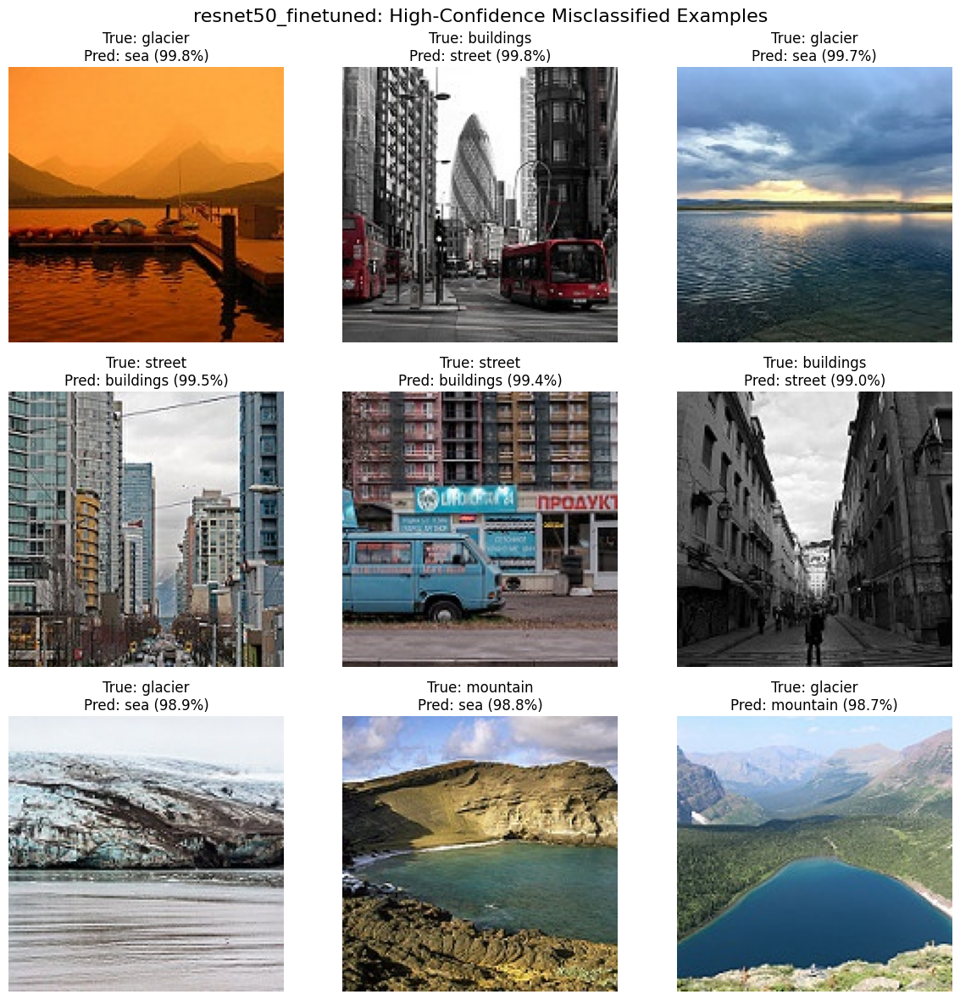

In [ ]:
# Error analysis on the best model

if best_model is not None:
    if best_model.input_shape[1] == 224:
        error_analysis_dataset = test_ds_224
    else:
        error_analysis_dataset = test_ds_150

    error_details_df = prediction_details(
        model=best_model,
        dataset=error_analysis_dataset,
        paths=test_paths,
        model_name=best_model_name
    )

    display(error_details_df.head())

    incorrect_df = error_details_df[error_details_df["correct"] == False].copy()
    print("Total test examples:", len(error_details_df))
    print("Correct predictions:", int(error_details_df["correct"].sum()))
    print("Incorrect predictions:", len(incorrect_df))
    print("Error rate:", round(len(incorrect_df) / len(error_details_df), 4))

    display(
        incorrect_df
        .sort_values(by="confidence", ascending=False)
        .head(10)[["true_class", "predicted_class", "confidence", "path"]]
    )

    error_details_path = OUTPUT_DIR / "final_model_error_analysis.csv"
    error_details_df.to_csv(error_details_path, index=False)
    print("Saved error analysis to:", error_details_path)

    plot_misclassified_examples(
        error_details_df,
        title=f"{best_model_name}: High-Confidence Misclassified Examples",
        number=9
    )
else:
    print("Skipping error analysis because best_model is not available.")

## Final Summary



In [ ]:
# Final summary of the model

def get_accuracy_text(model_name):
    row = final_all_models_df[final_all_models_df["Model"] == model_name]
    if len(row) == 0:
        return "not available"
    return f"{float(row.iloc[0]['Test Accuracy']):.4f} test accuracy"

baseline_text = get_accuracy_text("baseline_cnn")
deep_text = get_accuracy_text("deeper_cnn_adam")
sgd_text = get_accuracy_text("deeper_cnn_sgd")
ablation_text = get_accuracy_text("ablation_no_dropout")
mobilenet_feature_text = get_accuracy_text("mobilenetv2_feature_extraction")
mobilenet_finetune_text = get_accuracy_text("mobilenetv2_finetuned")

summary_lines = []
summary_lines.append("FINAL MODELLING SUMMARY")
summary_lines.append("=" * 55)
summary_lines.append(f"Number of classes: {NUM_CLASSES}")
summary_lines.append(f"Classes: {', '.join(CLASS_NAMES)}")
summary_lines.append(f"Training samples: {len(train_paths)}")
summary_lines.append(f"Validation samples: {len(val_paths)}")
summary_lines.append(f"Testing samples: {len(test_paths)}")
summary_lines.append("")
summary_lines.append("Completed experiments:")
summary_lines.append(f"1. Baseline CNN from scratch: {baseline_text}")
summary_lines.append(f"2. Deeper CNN with regularization: {deep_text}")
summary_lines.append(f"3. Deeper CNN with SGD optimizer: {sgd_text}")
summary_lines.append(f"4. Ablation without Dropout: {ablation_text}")
summary_lines.append(f"5. MobileNetV2 feature extraction: {mobilenet_feature_text}")
summary_lines.append(f"6. MobileNetV2 fine-tuning: {mobilenet_finetune_text}")
if "resnet_model" in globals():
    summary_lines.append("7. Optional ResNet50 comparison was also executed.")
summary_lines.append("")
summary_lines.append("Best model according to test accuracy:")
summary_lines.append(f"Model: {best_model_name}")
summary_lines.append(f"Test accuracy: {float(best_model_row['Test Accuracy']):.4f}")
summary_lines.append(f"Macro F1-score: {float(best_model_row['Macro F1']):.4f}")
summary_lines.append(f"Weighted F1-score: {float(best_model_row['Weighted F1']):.4f}")
summary_lines.append(f"Training time: {float(best_model_row['Training Time (minutes)']):.2f} minutes")
summary_lines.append(f"Parameters: {int(best_model_row['Parameters']):,}")
summary_lines.append("")
summary_lines.append("Interpretation guidance:")
summary_lines.append("- The baseline CNN provides a reference point for models trained from scratch.")
summary_lines.append("- The deeper CNN tests whether increased convolutional depth improves generalization.")
summary_lines.append("- Batch Normalization stabilizes training, Dropout reduces overfitting, and L2 regularization penalizes large weights.")
summary_lines.append("- Adam and SGD are compared to evaluate convergence speed and final performance.")
summary_lines.append("- The ablation study isolates the impact of Dropout by removing it from the deeper CNN.")
summary_lines.append("- MobileNetV2 uses pretrained ImageNet features and is expected to improve performance with less training time.")
summary_lines.append("- Fine-tuning adapts the final pretrained layers to the scene classification dataset using a low learning rate.")
summary_lines.append("")
summary_lines.append("Conclusion template:")
summary_lines.append("The experiments show the progression from a simple CNN baseline to a regularized deeper CNN and finally to transfer learning. The final selected model should be justified using test accuracy, macro F1-score, confusion matrix behaviour, training time, parameter count, and error analysis.")

report_summary = "\n".join(summary_lines)
print(report_summary)

summary_path = OUTPUT_DIR / "final_report_ready_model_summary.txt"
summary_path.write_text(report_summary)

print("Saved report-ready summary to:", summary_path)


FINAL MODELLING SUMMARY
Number of classes: 6
Classes: buildings, forest, glacier, mountain, sea, street
Training samples: 11193
Validation samples: 2799
Testing samples: 3000

Completed experiments:
1. Baseline CNN from scratch: 0.8453 test accuracy
2. Deeper CNN with regularization: 0.8363 test accuracy
3. Deeper CNN with SGD optimizer: 0.5917 test accuracy
4. Ablation without Dropout: 0.8633 test accuracy
5. MobileNetV2 feature extraction: 0.9170 test accuracy
6. MobileNetV2 fine-tuning: 0.9303 test accuracy
7. Optional ResNet50 comparison was also executed.

Best model according to test accuracy:
Model: resnet50_finetuned
Test accuracy: 0.9353
Macro F1-score: 0.9369
Weighted F1-score: 0.9352
Training time: 13.72 minutes
Parameters: 23,850,758

Interpretation guidance:
- The baseline CNN provides a reference point for models trained from scratch.
- The deeper CNN tests whether increased convolutional depth improves generalization.
- Batch Normalization stabilizes training, Dropout re